Progression of preprocessing:
- Cropped to AOI (within intersection of image bounds)
- Coregistered
- Pansharpened (ms only)

In [1]:
%load_ext autoreload
%autoreload 2

import os, sys
import numpy as np
from pathlib import Path
from datetime import datetime, timedelta
import ot # optimal transport
from PIL import Image

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns

from shapely import Polygon, area
from shapely.ops import substring, polygonize
from shapely.geometry import LineString, MultiPoint
from shapely.ops import unary_union

from scipy.ndimage import median_filter
from scipy.spatial import KDTree
from scipy.stats import ks_2samp, norm, multivariate_normal
from scipy.signal import convolve2d
import skgstat

# coastsat modules
sys.path.insert(0, os.pardir)
from coastsat import SDS_download, SDS_preprocess, SDS_shoreline, SDS_tools, SDS_classify, SDS_transects
from osgeo import gdal
gdal.UseExceptions()

from indices import *
from thresholding import *
from spectral_plotting import plot_extractions
import wv_utils as wv
import wv_eval
import wv_eval_plotting as wvep
import modified_coastsat
import metrics as m
import local_sl_extraction as lse
import spectral_unmixing as su

# paths
base_dir = r"C:\Users\avanever\Documents\ColombiaData\WV3 SWIR\W075_N10\20200104T15431"
# base_dir = "C:\\Users\\avanever\\Documents\\Imagery Datasets\\WV3 SWIR\\W075_N10\\20200104T15431"
swir_fn = os.path.join(base_dir, "20JAN04154316-A3DS-015384188020_01_P001.TIF")
ms_fn = os.path.join(base_dir, "20JAN04154317-M3DS-015384188010_01_P001.TIF")
pan_fn = os.path.join(base_dir, "20JAN04154317-P3DS-015384188010_01_P001.TIF")
# ref_sl_path = Path(r"C:\Users\avanever\Documents\CoastSatProject\Experiments\data\colombia_hand_digitized\colombia_hand_shoreline.shp")
ref_sl_path = Path(r"C:\Users\avanever\Documents\ColombiaData\colombia_hand_digitized\colombia_hand_shoreline.shp")


In [2]:
# both transects and shoreline are in EPSG32618 - no conversions necessary

# load low res sim image
sim_fn = wv.get_sim_tif_name("naive_res_10", base_dir)
sim = gdal.Open(sim_fn, gdal.GA_ReadOnly)
georef = sim.GetGeoTransform()
image_epsg = 32618

sim_bands = wv.load_sim_tif(sim_fn)
im_rgb = sim_bands[:,:,[2, 1, 0]]

# load transects
# transect_fn = Path(r"C:\Users\avanever\Documents\CoastSatProject\Experiments\data\transects\colombia_transects.geojson")
transect_fn = Path(r"C:\Users\avanever\Documents\ColombiaData\colombia_transects.geojson")
transects = np.array(list(SDS_tools.transects_from_geojson(transect_fn).values()))
print(f"{transects.shape = }")

# load reference shoreline
ref_sl_list = wv.load_ref_sl(ref_sl_path)
ref_sl_pxl_list = wv.ref_sl_to_pxl(ref_sl_list, georef)
ref_sl_points = wv.shoreline_to_points(ref_sl_list, delta=0.5)
sl_buffer = wv.create_shoreline_buffer(sim_bands.shape[:-1], ref_sl_pxl_list, 10)
print(f"{ref_sl_points.shape = }")

# initialize empty cloud mask
im_nodata = np.full(sim_bands.shape[:-1], False)
cloud_mask = np.full(sim_bands.shape[:-1], False)

# convert transects and reference shoreline to pixel space
transects_0_pxl = SDS_tools.convert_world2pix(transects[:,0,:], georef)
transects_1_pxl = SDS_tools.convert_world2pix(transects[:,1,:], georef)
transects_pix = np.swapaxes(np.stack([transects_0_pxl, transects_1_pxl]), 0, 1)
ref_sl_points_pxl = SDS_tools.convert_world2pix(ref_sl_points, georef)

# data/settings dictionaries
sds_settings = {
    'output_epsg': image_epsg,
    'max_dist_ref': 400,
    'min_length_sl': 150, # 500
    'dist_clouds': 30,
}

collider_settings = dict(
    past_dist = 10,
    along_dist = 25,
    min_chainage = -10
)

sds_data = dict(
    cloud_mask=cloud_mask,
    sl_buffer=sl_buffer,
    im_nodata=im_nodata,
    georef=georef,
    image_epsg=image_epsg,
    sds_settings=sds_settings
)

# fig, ax = plt.subplots(1, 1)
# for ref_sl in ref_sl_list:
#     ax.scatter(ref_sl[:,0], ref_sl[:,1], c="black")
# for transect in transects:
#     ax.plot(transect[:,0], transect[:,1], c="red")

86 transects have been loaded 
coordinates are in epsg:4326
transects.shape = (86, 2, 2)
ref_sl_points.shape = (22900, 2)


# Preprocessing

takes a few minutes, larger AOI may run into memory allocation issues (pansharpening). Running functions one at a time may allow for larger AOI (gives garbage collection to catch up maybe?)

Produces high resolution pansharpened image and degraded image

Note: rerunning may cause issues with already having files open

In [ ]:
# prepare AOI in world coordinates (for Colombia WV3 image)
aoi = np.array([[3500, 2400], # bigger (pushing it)
                [3500, 4000],
                [500, 4000],
                [500, 2400],
                [3500, 2400]])

# aoi = np.array([[2500, 2500], # smaller
#                 [2500, 3500],
#                 [1250, 3500],
#                 [1250, 2500],
#                 [2500, 2500]])
ms = gdal.Open(ms_fn, gdal.GA_ReadOnly)
gt = ms.GetGeoTransform()
aoi_world = np.array([[gt[0] + x * gt[1], gt[3] + y * gt[5]] for x, y in aoi])

In [ ]:
# both pipelines require cropping
wv.crop_tifs(swir_fn, pan_fn, ms_fn, aoi_world, base_dir)

# high res
wv.coreg_tifs(base_dir, gdal.GRA_Average) # coregister different bands together (ms, swir, pan)
wv.pansharpen(base_dir)

# low res
target_res = 10
swir_deg_fn, ms_deg_fn = wv.naive_degradation(target_res, gdal.GRA_Bilinear, base_dir)
sim_fn = wv.naive_band_smushing(ms_deg_fn, swir_deg_fn, base_dir)

In [ ]:
deg_type = f"naive_res_{target_res}"
wv.plot_preprocessing_steps(base_dir, deg_type)

# Individual Preprocessing Steps

## EDA

In [ ]:
ms_bands = wv.load_tif(ms_fn)
print(f"{ms_bands.shape = }")

# pan_bands = load_tif(pan_fn)
# print(f"{pan_bands.shape = }")

# swir_bands = load_tif(swir_fn, is_swir=True)
# print(f"{swir_bands.shape = }")

In [ ]:
y_dim = 2000
y_start = 200
x_dim = 3000
x_start = 0

bands = wv.crop(ms_bands, x_start, x_dim, y_start, y_dim)
bands.shape

In [ ]:
cloud_mask = np.zeros(bands.shape[:-1], dtype=bool)

In [ ]:
idx_comb = [4, 2, 1] # RGB
fig, ax = plt.subplots(1, 1, figsize=(8, 12), tight_layout=True)
im_adj = SDS_preprocess.rescale_image_intensity(bands[:,:,idx_comb], cloud_mask, 99.9)
ax.imshow(im_adj)
ax.set_title(str(idx_comb))

## Cropping

In [ ]:
aoi = np.array([[3500, 2400],
                [3500, 4000],
                [500, 4000],
                [500, 2400],
                [3500, 2400]])

# aoi = np.array([[2500, 2500],
#                 [2500, 3500],
#                 [1250, 3500],
#                 [1250, 2500],
#                 [2500, 2500]])


ms = gdal.Open(ms_fn, gdal.GA_ReadOnly)
gt = ms.GetGeoTransform()
aoi_world = np.array([[gt[0] + x * gt[1], gt[3] + y * gt[5]] for x, y in aoi])

In [ ]:
aoi_pix = SDS_tools.convert_world2pix(aoi_world, ms.GetGeoTransform())
ms_bands = wv.load_tif(ms_fn)

fig, ax = plt.subplots(1, 1, figsize=(12, 8))
ax.imshow(ms_bands[:,:,[4, 2, 1]])
ax.plot(aoi[:,0], aoi[:,1], c="blue")
ax.plot(aoi_pix[:,0], aoi_pix[:,1], c="green")

In [ ]:
crop_swir_fn, crop_pan_fn, crop_ms_fn = wv.crop_tifs(swir_fn, pan_fn, ms_fn, aoi_world, base_dir)

In [ ]:
crop_bands = wv.load_tif(crop_swir_fn, is_swir=True)
print(crop_bands.shape)
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
ax.imshow(crop_bands[:,:,[4, 2, 1]])
# ax.imshow(crop_bands) # for pan

## Coregistration

In [81]:
coreg_swir_fn, coreg_pan_fn, coreg_ms_fn = wv.coreg_tifs(base_dir, gdal.GRA_Bilinear)

In [82]:
# sanity check (values should all be the same)
for fn in [coreg_swir_fn, coreg_ms_fn, coreg_pan_fn]:
    ds = gdal.Open(fn)
    gt = ds.GetGeoTransform()
    f = fn.split("\\")[-1]
    print(f"{f}: size=({ds.RasterXSize}, {ds.RasterYSize}), origin=({gt[0]:.2f}, {gt[3]:.2f}), res=({gt[1]}, {gt[5]})")

swir_cropped.tif: size=(12000, 6400), origin=(439824.00, 1152132.00), res=(0.3, -0.3)
ms_cropped.tif: size=(12000, 6400), origin=(439824.00, 1152132.00), res=(0.3, -0.3)
pan_cropped.tif: size=(12000, 6400), origin=(439824.00, 1152132.00), res=(0.3, -0.3)


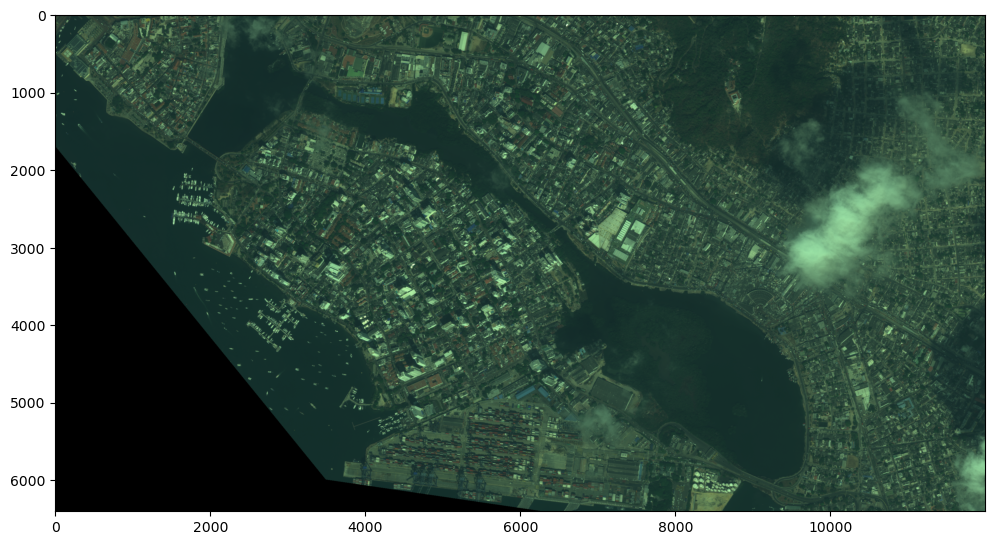

In [83]:
crop_bands = wv.load_tif(coreg_ms_fn, is_swir=False)
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
ax.imshow(crop_bands[:,:,[4, 2, 1]])
# ax.imshow(crop_bands) # for pan

## Pansharpening

panchromatic band covers 450-800nm. This covers blue, green, yellow, red, and red edge. NIR1 covers 770-895nm which partially overlaps, but is excluded here.

In [ ]:
ps_ms_fn = wv.pansharpen(base_dir)

In [ ]:
ps_ms_fn = wv.get_ps_tif_name(base_dir)
ps_bands = wv.load_tif(ps_ms_fn, is_swir=False)
cloud_mask = np.zeros(ps_bands.shape[:-1], dtype=bool)
print(f"{ps_bands.shape = }")

wv.plot_bands(ps_bands, ps_bands.shape[-1], cloud_mask)

In [ ]:
coreg_ms_fn = wv.get_coreg_tif_name("ms", base_dir)
coreg_bands = wv.load_tif(coreg_ms_fn, is_swir=False)
cloud_mask = np.zeros(coreg_bands.shape[:-1], dtype=bool)
print(f"{coreg_bands.shape = }")

wv.plot_bands(coreg_bands, coreg_bands.shape[-1], cloud_mask)

## High Res Automated Shoreline Extraction

In [ ]:
def ndwi_from_ms(bands):
    green = bands[:,:,2]
    nir = bands[:,:,6]
    return (green - nir) / (nir + green)

coreg_ms_fn = wv.get_coreg_tif_name("ms", base_dir)
coreg_bands = wv.load_tif(coreg_ms_fn, is_swir=False)

In [ ]:
ndwi_im = ndwi_from_ms(coreg_bands)
ndwi_no_nan = ndwi_im[~np.isnan(ndwi_im)]
otsu_t = filters.threshold_otsu(ndwi_no_nan.ravel())
contours = measure.find_contours(ndwi_im, otsu_t)

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
ax.imshow(coreg_bands[:,:,[4, 2, 1]])
for contour in contours:
    ax.plot(contour[:,1], contour[:,0], c="white")

well darn

## Hand-Digitized Shoreline

In [ ]:
ms_fn = wv.get_coreg_tif_name("ms", base_dir)
ms = gdal.Open(ms_fn)

ref_sl_list, ref_sl_pxl_list = wv.load_ref_sl(ref_sl_path, ms.GetGeoTransform())
ms_bands = wv.load_tif(ms_fn)

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(12, 8), tight_layout=True)
ax.imshow(ms_bands[:,:, [4, 2, 1]])

for line_px in ref_sl_pxl_list:
    ax.plot(line_px[:,0], line_px[:,1], c="white")

plt.show()
plt.close(fig)

## Degrading Imagery

In [ ]:
res=20
swir_deg_fn, ms_deg_fn = wv.naive_degradation(res, gdal.GRA_Bilinear, base_dir)
sim_fn = wv.get_sim_tif_name(f"naive_res_{res}", base_dir)
sim_fn = wv.naive_band_smushing(ms_deg_fn, swir_deg_fn, sim_fn)

In [ ]:
# sanity check (values should all be the same)
for fn in [swir_deg_fn, ms_deg_fn]:
    ds = gdal.Open(fn)
    gt = ds.GetGeoTransform()
    f = fn.split("\\")[-1]
    print(f"{f}: size=({ds.RasterXSize}, {ds.RasterYSize}), origin=({gt[0]:.2f}, {gt[3]:.2f}), res=({gt[1]}, {gt[5]})")

In [ ]:
sim_bands = wv.load_sim_tif(sim_fn)
print(sim_bands.shape)

fig, axs = plt.subplots(1, 1, figsize=(40, 20), tight_layout=True)
# axs.axis(False)
axs.imshow(sim_bands[:,:,[2, 1, 0]], interpolation=None)




# fig_dir = Path(r"C:\Users\avanever\Documents\CoastSatProject\Experiments\wv3")
# fig_name = "test2.jpg"
# plt.savefig(os.path.join(fig_dir, fig_name))


# sim = gdal.Open(sim_fn)
# ref_sl_list, ref_sl_pxl_list = wv.load_ref_sl(ref_sl_path, sim.GetGeoTransform())
# for line_px in ref_sl_pxl_list:
#     axs.scatter(line_px[:,0], line_px[:,1], c="white", s=0.1)

# Analysis

## Applying Shoreline Extraction

In [244]:
sim_fn = wv.get_sim_tif_name("naive_res_10", base_dir)
sim_bands = wv.load_sim_tif(sim_fn)
sim = gdal.Open(sim_fn)

ref_sl_list, ref_sl_pxl_list = wv.load_ref_sl(ref_sl_path, sim.GetGeoTransform())
sl_buffer = wv.create_shoreline_buffer(sim_bands.shape[:-1], ref_sl_pxl_list, 10)

fig, ax = plt.subplots(1, 1)
ax.imshow(sl_buffer)

TypeError: load_ref_sl() takes 1 positional argument but 2 were given

In [ ]:
cloud_mask = np.full(sim_bands.shape[:-1], False)
settings = {
    'output_epsg': 4326,
    'max_dist_ref': 400,
    'min_length_sl': 500,
    'dist_clouds': 30,
}

index_functions = [
    mndwi,
    ndwi,
    awei_ns,
    awei_sh,
    scowi,
    wi2015,
    andwi,
    wri,
    ewi,
    nwi,
    wi2019
]
threshold_functions = [
    otsu,
    local_min_otsu
]
plot_extractions(
    sim_bands,
    "Colombia",
    index_functions,
    threshold_functions,
    cloud_mask,
    sl_buffer,
    cloud_mask,
    sim.GetGeoTransform(),
    4326,
    settings,
    rescale=False,
    gt_sl=ref_sl_pxl_list
)

## Evaluation

- Per Transect Metrics
    - Average distance (area / width)
    - Distance between median (SDS method)
    - Variance in distance (variance in distances every 1m or something? is there a better way to calculate this)
- Shoreline wide metrics
    - Distance to nearest point (gamed by messy shorelines, doesn't give indication of bias)

### Area Metric

In [ ]:
contours = wv_eval.extract_shoreline(sim_bands, mndwi, local_min_otsu, sds_data)
contours_pxl = SDS_tools.convert_world2pix(contours, georef)

transect_idx = 0
gt_inter = modified_coastsat.get_intersections(transects[transect_idx,:,:], ref_sl_points, collider_settings)
sds_inter = modified_coastsat.get_intersections(transects[transect_idx,:,:], contours, collider_settings)

fig, ax = plt.subplots(1, 1, figsize=(12, 8))
ax.scatter(gt_inter[1,:], gt_inter[0,:])
ax.scatter(sds_inter[1,:], sds_inter[0,:])
ax.set_aspect('equal', adjustable='box')

In [ ]:
# test dataset ("hook" shape)
v0 = np.array([-7, 2])
a = np.array([3, -0.5])
times = np.arange(1, 5, 0.2)

ds1 = np.array([0.5 * a * t**2 + v0 * t for t in times])
ds2 = ds1 + np.array([2, -5])
# v0 = np.array([-10, 2])

# v0 = np.array([-7, 2])
# times = np.arange(1, 5, 0.2)
# ds2 = np.array([0.5 * a * t**2 + v0 * t for t in times]) + np.array([2, -5])

fig, ax = plt.subplots()
ax.scatter(ds1[:,0], ds1[:,1])
ax.scatter(ds2[:,0], ds2[:,1], c="red")

In [ ]:
transect_idx = 0

In [ ]:
# returns indexes at which arr crosses an x value
def get_x_intersections(x, arr):
    idx = []
    for i in range(len(arr) - 1):
        # print(f"{i}: {x = }, {arr[i,0]}, {arr[i+1,0]} {x < arr[i,0]} {x < arr[i+1,0]}")
        if (x < arr[i,0]) != (x < arr[i+1,0]):
            idx.append(i)

    return idx

def get_matching_point(p, arr):
    idx = np.searchsorted(arr[:,0], p[0])
    new_y = m.lerp(arr[idx-1,:], arr[idx,:], p[0])

# returns False if there are multiple shorelines at x = ref[idx,0]
def is_valid_intersections(ref, other, idx):
    x_int = get_x_intersections(ref[idx,0], other)
    x_int_self = get_x_intersections(ref[idx,0], ref[1:,:]) # don't want to intersect with first point (fp sucks)
    return len(x_int) == 1 and len(x_int_self) == 0, x_int

# if there is a doubled shoreline covering the start or end of the line, return None
def preprocess_intersections(sds, gt):

    # reformat from [[y,x],idx] to [idx,[x,y]]
    sds = sds[[1, 0],:]
    gt = gt[[1, 0],:]
    sds = sds.T
    gt = gt.T

    # lower bound
    if gt[0,0] < sds[0,0]:
        if not is_valid_intersections(sds, gt, 0): return None
        lower_bound = sds[0,0]
    else:
        if not is_valid_intersections(gt, sds, 0): return None
        lower_bound = gt[0,0]
    
    # upper bound
    if gt[-1,0] > sds[-1,0]:
        if not is_valid_intersections(sds, gt, -1): return None
        upper_bound = sds[-1,0]
    else:
        if not is_valid_intersections(gt, sds, -1): return None
        upper_bound = gt[-1,0]

    ...

In [ ]:
x_int = get_x_intersections(ds1[0,0], ds2)
x_int_self = get_x_intersections(ds1[0,0], ds1[1:,:]) # don't want to return the same point

# plotting
fig, ax = plt.subplots(1, 4, figsize=(16, 4))
ax[0].scatter(ds1[:,0], ds1[:,1])
ax[0].scatter(ds2[:,0], ds2[:,1])

ax[1].scatter(ds1[10:,0], ds1[10:,1])
ax[1].scatter(ds2[:,0], ds2[:,1])

ax[2].scatter(ds1[:,0], ds1[:,1])
ax[2].scatter(ds2[10:,0], ds2[10:,1])

ax[3].scatter(ds1[10:,0], ds1[10:,1])
ax[3].scatter(ds2[10:,0], ds2[10:,1])

ax[0].axvline(ds1[0,0])
for idx in x_int:
    ax[0].scatter(ds2[idx,0], ds2[idx,1], c="red", zorder=10)
for idx in x_int_self:
    idx += 1
    ax[0].scatter(ds1[idx,0], ds1[idx,1], c="red")

In [ ]:

source_gt_inter = modified_coastsat.get_intersections(transects[transect_idx,:,:], ref_sl_points, collider_settings)
source_sds_inter = modified_coastsat.get_intersections(transects[transect_idx,:,:], contours, collider_settings)

# source_sds_inter = source_sds_inter[:,:2]

gt_inter = m.format_inter(source_gt_inter)
sds_inter = m.format_inter(source_sds_inter)

matching_sds = m.add_matching_points(gt_inter, sds_inter)
matching_gt = m.add_matching_points(sds_inter, gt_inter)

combined1_sds = m.sort_by_x(np.concat([sds_inter, matching_sds]))
combined1_gt = m.sort_by_x(np.concat([gt_inter, matching_gt]))

filtered_sds, filtered_gt = m.filter_inters(combined1_sds, combined1_gt)

poly = Polygon(np.concatenate([filtered_sds, filtered_gt[::-1], [filtered_sds[0]]]))
poly_exterior = poly.exterior
mls = poly_exterior.intersection(poly_exterior)
polys = polygonize(mls)
cum_area = 0
for p in polys:
    cum_area += p.area

print(cum_area)
print(m.get_average_distance(source_sds_inter, source_gt_inter))


fig, ax = plt.subplots(1, 2, figsize=(12, 8))
ax[0].scatter(filtered_gt[:,0], filtered_gt[:,1])
ax[0].scatter(filtered_sds[:,0], filtered_sds[:,1])
ax[0].set_aspect('equal', adjustable='box')

for p in polys:
    x, y = p.exterior.xy
    ax[1].plot(x, y)

# transect_idx += 1

In [ ]:
gt_inter = modified_coastsat.get_intersections(transects[transect_idx,:,:], ref_sl_points, collider_settings)
sds_inter = modified_coastsat.get_intersections(transects[transect_idx,:,:], contours, collider_settings)

gt_inter = m.format_inter(gt_inter)
sds_inter = m.format_inter(sds_inter)

matching_sds = m.add_matching_points(gt_inter, sds_inter)
matching_gt = m.add_matching_points(sds_inter, gt_inter)

combined1_sds = m.sort_by_x(np.concat([sds_inter, matching_sds]))
combined1_gt = m.sort_by_x(np.concat([gt_inter, matching_gt]))

filtered_sds, filtered_gt = m.filter_inters(combined1_sds, combined1_gt)

inter = m.add_points_at_intersections(filtered_sds, filtered_gt)

combined2_sds = m.sort_by_x(np.concat([filtered_sds, inter]))
combined2_gt = m.sort_by_x(np.concat([filtered_gt, inter]))
assert filtered_sds.shape == filtered_gt.shape

cum_area = 0
for i in range(filtered_sds.shape[0]-1):
    cum_area += m.trapezoid_area(combined2_sds[i,:], combined2_sds[i+1,:], combined2_gt[i,:], combined2_gt[i+1,:])

cum_area

In [ ]:
transect_idx = 32
print(transect_idx)
gt_inter = modified_coastsat.get_intersections(transects[transect_idx,:,:], ref_sl_points, collider_settings)
sds_inter = modified_coastsat.get_intersections(transects[transect_idx,:,:], contours, collider_settings)

fig, ax = plt.subplots(1, 1, figsize=(12, 8))
ax.scatter(gt_inter[1,:], gt_inter[0,:])
ax.scatter(sds_inter[1,:], sds_inter[0,:])
ax.set_aspect('equal', adjustable='box')

### Other Metrics

In [ ]:
med_dist, _ = m.get_median_distances(transects, ref_sl_points, contours, collider_settings)
fig = wvep.plot_transect_metric(med_dist, (-10, 100), transects_pix, ref_sl_points_pxl, contours_pxl, im_rgb)

In [ ]:
dists = m.get_nearest_distance(ref_sl_points, contours)
dists.shape, ref_sl_points.shape

In [ ]:
idx = np.where(dists < 25)[0]
plt.hist(dists[idx], bins=50);

In [ ]:
fig = wvep.plot_shoreline_metric(dists, (0, 25), ref_sl_points_pxl, contours_pxl, im_rgb)
fig_dir = Path(r"C:\Users\avanever\Documents\CoastSatProject\Experiments\wv3")
fig_name = "test.png"
plt.savefig(os.path.join(fig_dir, fig_name))

### Run All Methods

In [3]:
index_functions = [
    mndwi,
    ndwi,
    awei_ns,
    awei_sh,
    scowi,
    wi2015,
    andwi,
    wri,
    ewi,
    nwi,
    wi2019,
    tct_wetness,
    ddwi,
    ensemble1,
    ensemble2,
]
threshold_functions = [
    otsu,
    local_min_otsu
]
ensemble_idx_funcs = index_functions[:-2] # all but the ensemble indices

In [4]:
shoreline_metric, transect_metric, methods, info = wv_eval.evaluate_methods(
    index_functions, threshold_functions, sim_bands, ref_sl_points, transects, collider_settings, sds_data, ensemble_idx_funcs
)
entries, outlier_idx = wv_eval.organize_metrics(shoreline_metric, transect_metric, methods)

30it [00:28,  1.05it/s]


In [26]:
wv_eval.print_metrics(entries, sort_variable="sl_mean")
print("\n")
wv_eval.print_metrics(entries, sort_variable="t_mae")
print("\n")
wv_eval.print_metrics(entries, sort_variable="sl_n_outliers")
print("\n")
wv_eval.print_metrics(entries, sort_variable="t_mean")

                                    sl_mean    sl_std     sl_outlier   t_mean     t_std      t_mae     
ensemble2__otsu:                    5.023      2.652      1189         1.019      3.930      3.073     
ensemble1__otsu:                    5.403      2.839      1725         0.198      5.625      3.727     
ewi__otsu:                          5.464      3.176      1860         0.605      3.906      2.727     
andwi__otsu:                        5.503      2.959      1740         1.387      3.522      2.941     
nwi__otsu:                          5.816      3.223      1834         1.691      3.697      3.176     
tct_wetness__local_min_otsu:        6.401      3.950      2149         2.207      4.518      3.943     
mndwi__local_min_otsu:              6.443      3.838      1506         1.873      4.698      4.227     
ndwi__otsu:                         6.598      4.620      2058         0.066      4.159      2.939     
awei_ns__local_min_otsu:            6.631      3.678      1825  

### Outliers in shoreline vs transect metric

The outliers above the line in the following scatterplot all have significant negative biases (t_mean << 0). They all have messy extractions on the landside. This highlights the shortcoming of this metric

In [ ]:
# note the 3 outliers
sl_means = [e['sl_mean'] for e in entries]
t_mae = [e['t_mae'] for e in entries]

fig, ax = plt.subplots()
ax.set_xlabel("sl_mean")
ax.set_ylabel("t_mae")
ax.set_title("metric comparison")
ax.scatter(sl_means, t_mae)

In [ ]:
index_fn = ddwi
thresh_fn = otsu

contours = wv_eval.extract_shoreline(sim_bands, index_fn, thresh_fn, sds_data)
contours_pxl = SDS_tools.convert_world2pix(contours, georef)
dists = m.get_nearest_distance(ref_sl_points, contours)
fig = wvep.plot_shoreline_metric(dists, (0, 25), ref_sl_points_pxl, contours_pxl, im_rgb)

In [ ]:
index_im = ddwi(sim_bands.reshape(-1, sim_bands.shape[-1])).reshape(sim_bands.shape[:-1])
plt.imshow(index_im < otsu(index_im.ravel(), cloud_mask, sl_buffer))

In [ ]:
# slight outlier below the line
index_fn = ndwi
thresh_fn = otsu
contours = wv_eval.extract_shoreline(sim_bands, index_fn, thresh_fn, sds_data)
contours_pxl = SDS_tools.convert_world2pix(contours, georef)

dists = m.get_nearest_distance(ref_sl_points, contours)
fig = wvep.plot_shoreline_metric(dists, (0, 25), ref_sl_points_pxl, contours_pxl, im_rgb)

med_dists, _ = m.get_median_distances(transects, ref_sl_points, contours, collider_settings)
fig = wvep.plot_transect_metric(med_dists, (-10, 100), transects_pix, ref_sl_points_pxl, contours_pxl, im_rgb)

In [ ]:
# Pareto frontier (best on both metrics)
index_fn = ewi
thresh_fn = otsu
contours = wv_eval.extract_shoreline(sim_bands, index_fn, thresh_fn, sds_data)
contours_pxl = SDS_tools.convert_world2pix(contours, georef)

dists = m.get_nearest_distance(ref_sl_points, contours)
fig = wvep.plot_shoreline_metric(dists, (0, 25), ref_sl_points_pxl, contours_pxl, im_rgb)

med_dists, _ = m.get_median_distances(transects, ref_sl_points, contours, collider_settings)
fig = wvep.plot_transect_metric(med_dists, (-10, 100), transects_pix, ref_sl_points_pxl, contours_pxl, im_rgb)

In [ ]:
# Fewest outliers (>25m in shoreline metric)
index_fn = wi2019
thresh_fn = otsu
contours = wv_eval.extract_shoreline(sim_bands, index_fn, thresh_fn, sds_data)
contours_pxl = SDS_tools.convert_world2pix(contours, georef)

dists = m.get_nearest_distance(ref_sl_points, contours)
fig = wvep.plot_shoreline_metric(dists, (0, 25), ref_sl_points_pxl, contours_pxl, im_rgb)

med_dists, _ = m.get_median_distances(transects, ref_sl_points, contours, collider_settings)
fig = wvep.plot_transect_metric(med_dists, (-10, 100), transects_pix, ref_sl_points_pxl, contours_pxl, im_rgb)

### Best methods for shoreline metric

In [ ]:
values = np.nanmin(shoreline_metric, axis=0)
best_per_point_idx = np.nanargmin(shoreline_metric, axis=0)
labels = methods[best_per_point_idx]

fig = wvep.plot_best_score_per_point(values, ref_sl_points_pxl, im_rgb)

In [ ]:
plt.hist(values);

In [ ]:
fig = wvep.plot_best_method_per_point(best_per_point_idx, methods, ref_sl_points_pxl, im_rgb)

In [ ]:
idx, counts = np.unique(best_per_point_idx, return_counts=True)
plt.bar(methods[idx], counts)
plt.xticks(rotation=90);

### Best methods for transect metric

In [ ]:
best_per_transect_idx = np.nanargmin(np.abs(transect_metric), axis=0)
t_idx = [i for i in range(transect_metric.shape[1])]
values = transect_metric[best_per_transect_idx, t_idx]
labels = methods[best_per_transect_idx]

fig = wvep.plot_best_score_per_transect(values, transects_pix, ref_sl_points_pxl, im_rgb)

In [ ]:
plt.hist(values);

In [ ]:
fig = wvep.plot_best_method_per_transect(best_per_transect_idx, methods, transects_pix, ref_sl_points_pxl, im_rgb)

In [ ]:
idx, counts = np.unique(best_per_transect_idx, return_counts=True)
plt.bar(methods[idx], counts)
plt.xticks(rotation=90);

### Box Plots

In [ ]:
fig = wvep.violin_plots(shoreline_metric, methods, outlier_t=(0, 25), box_instead=True, sort_methods=True)

In [ ]:
fig = wvep.violin_plots(transect_metric, methods, box_instead=True, sort_methods=True)

### Method Correlations

In [ ]:
corrmat = np.corrcoef(shoreline_metric)
corrcoef_tri = np.triu(corrmat)
corrmat.shape

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(12, 8))
im = ax[0].imshow(corrcoef_tri, cmap="Purples")
ax[0].set_xticks([y for y in range(len(methods))], labels=methods, rotation=90);
ax[0].set_yticks([y for y in range(len(methods))], labels=methods);
fig.colorbar(im, ax=ax[0]);

ax[1].hist(corrcoef_tri.ravel());

### Index correlations

In [ ]:
all_inds = np.zeros(shape=(len(index_functions), sim_bands.shape[0] * sim_bands.shape[1]))
for i, ind_func in enumerate(index_functions):
    im_flat = sim_bands.reshape(-1, sim_bands.shape[-1])
    index = ind_func(im_flat)
    all_inds[i] = index

# mask to remove the nans
bad_idx = np.full(all_inds.shape[1], False)
for row in all_inds:
    bad_idx |= np.isnan(row) | np.isinf(row)
assert np.sum(np.isnan(all_inds[:,~bad_idx])) == 0 # make sure no nans left

corrmat = np.corrcoef(all_inds[:,~bad_idx])
corrcoef_tri = np.triu(corrmat)
corrmat.shape

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(12, 8))
im = ax[0].imshow(corrmat, cmap="Purples")
func_names = [f.__name__ for f in index_functions]
ax[0].set_xticks([y for y in range(len(func_names))], labels=func_names, rotation=90)
ax[0].set_yticks([y for y in range(len(func_names))], labels=func_names)
fig.colorbar(im, ax=ax[0])

ax[1].hist(corrcoef_tri.ravel());

### Comparison with binarized indices

No significant difference for most metrics

In [ ]:
bin_shoreline_metric, bin_transect_metric, methods = wv_eval.evaluate_methods(
    index_functions, threshold_functions, sim_bands, ref_sl_points, transects, collider_settings, sds_data, ensemble_idx_funcs, binarize=True
)
bin_entries = wv_eval.organize_metrics(bin_shoreline_metric, bin_transect_metric, methods)

In [ ]:
wv_eval.print_metrics(bin_entries, 'sl_mean', first_col_width=35)
print("\n")
wv_eval.print_metrics(entries, 'sl_mean', first_col_width=35)

In [ ]:
metrics = list(entries[0].keys())[1:]
fig = wvep.plot_comparison(bin_entries, entries, "bin", "none", metrics)

#### Double check binarization is working right

In [ ]:
index_fn = ewi
thresh_fn = otsu

im_flat = sim_bands.reshape(-1, sim_bands.shape[-1])
index = index_fn(im_flat)
threshold = thresh_fn(index, sds_data["cloud_mask"], sds_data["sl_buffer"])
index = index > threshold
threshold = 0.5
contours = modified_coastsat.find_wl_contours1(index.reshape(sim_bands.shape[:-1]), sds_data["cloud_mask"], sds_data["sl_buffer"], threshold)

In [ ]:
contours[0][:10] # one of x or y is a whole number, other end in .5

### Band smoothing comparison

At first glance, smoothing with a 3x3 median filter seems to hurt

In [ ]:
smooth_shoreline_metric, smooth_transect_metric, methods = wv_eval.evaluate_methods(
    index_functions, threshold_functions, sim_bands, ref_sl_points, transects, collider_settings, sds_data, ensemble_idx_funcs, smooth=True
)
smooth_entries = wv_eval.organize_metrics(smooth_shoreline_metric, smooth_transect_metric, methods)
# wv_eval.print_metrics(smooth_entries, 'sl_mean')

In [ ]:
metric = 'sl_mean'
smooth_metric = [e[metric] for e in smooth_entries]
sl_metric = [e[metric] for e in entries]
fig = wvep.plot_comparison(smooth_metric, sl_metric, "smooth", "none", metric)

### Ensemble Index

In [ ]:
ensemble_index_functions = [
    mndwi,
    ndwi,
    andwi,
    wri,
    ewi,
    nwi,
    wi2019,

    scowi,
    awei_sh,
    wi2015,
    ddwi,
    awei_ns,
    tct_wetness
]


# ensemble_index = ensemble1(sim_bands, ensemble_index_functions, cloud_mask, sl_buffer)
ensemble_index = ensemble2(sim_bands, ensemble_index_functions, otsu, cloud_mask, sl_buffer)
plt.imshow(ensemble_index)

In [ ]:
index = ensemble_index
threshold = otsu(index, cloud_mask, sl_buffer)

contours = modified_coastsat.find_wl_contours1(index.reshape(sim_bands.shape[:-1]), cloud_mask, sl_buffer, threshold)
contours = SDS_shoreline.process_shoreline(contours, cloud_mask, im_nodata,
                                georef, image_epsg, sds_settings)
contours_pxl = SDS_tools.convert_world2pix(contours, georef)
dists = m.get_nearest_distance(ref_sl_points, contours)
fig = m.plot_shoreline_metric(dists, (0, 25), ref_sl_points_pxl, contours_pxl, index.reshape(sim_bands.shape[:-1]))
print(np.nanmean(dists[dists < 25]))

### Local Shoreline Extraction

In [62]:
shoreline_metric, transect_metric, methods, info = wv_eval.evaluate_methods(
    index_functions, threshold_functions, sim_bands, ref_sl_points, transects, collider_settings, sds_data, ensemble_idx_funcs
)
entries, outlier_idx = wv_eval.organize_metrics(shoreline_metric, transect_metric, methods)

lse_shoreline_metric, lse_transect_metric, methods, info = wv_eval.evaluate_methods(
    index_functions, threshold_functions, sim_bands, ref_sl_points, transects, collider_settings, sds_data, ensemble_idx_funcs, lse1=True
)
lse_entries, _ = wv_eval.organize_metrics(lse_shoreline_metric, lse_transect_metric, methods, outlier_idx)

30it [00:15,  1.97it/s]
30it [00:44,  1.48s/it]


In [63]:
wv_eval.print_metrics(lse_entries, "sl_mean")

                                    sl_mean      sl_mean_all  sl_std       sl_outlier     t_mean       t_std        t_mae       
ensemble2__otsu:                    5.202        8.044        2.817        1219           1.552        3.842        3.278       
ewi__otsu:                          5.312        7.775        3.113        1049           1.118        4.291        3.073       
ensemble1__otsu:                    5.394        6.273        3.280        491            0.738        5.167        3.628       
andwi__otsu:                        5.480        7.653        3.162        883            1.838        3.491        3.147       
ewi__local_min_otsu:                5.563        10.250       3.765        1771           -0.078       4.826        3.334       
nwi__otsu:                          5.702        8.858        3.404        1432           1.921        3.699        3.283       
nwi__local_min_otsu:                5.858        7.878        4.101        898            -0.010 

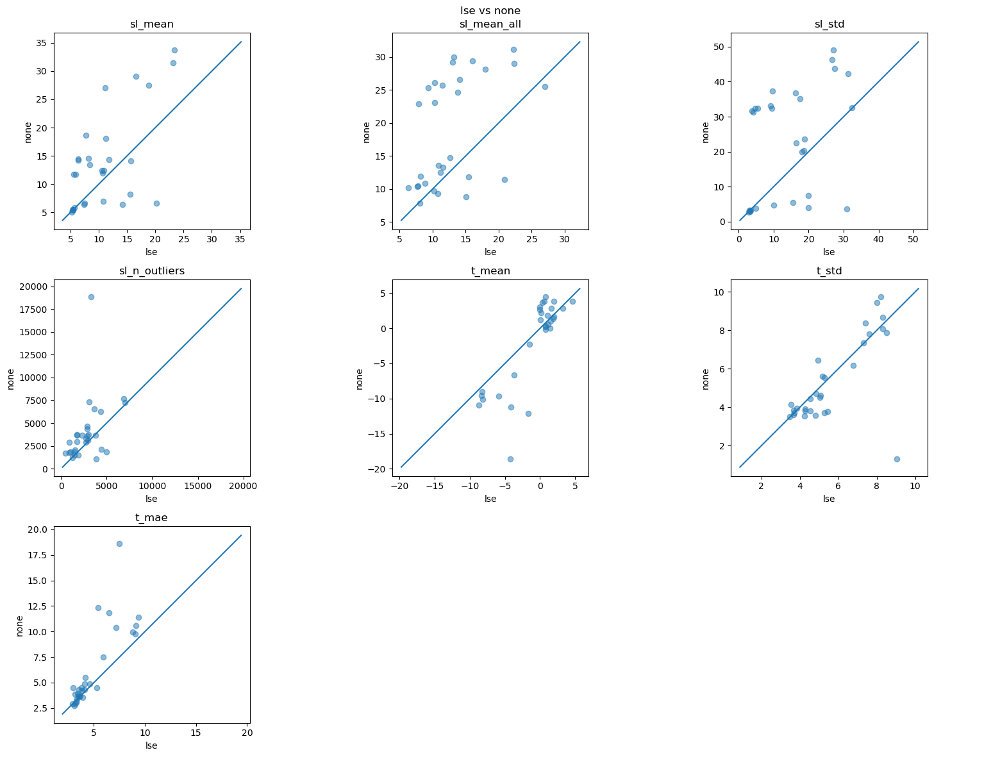

In [64]:
metrics = list(entries[0].keys())[1:]
fig = wvep.plot_comparison(lse_entries, entries, "lse", "none", metrics)

In [ ]:
bin_lse_shoreline_metric, bin_lse_transect_metric, methods = wv_eval.evaluate_methods(
    index_functions, threshold_functions, sim_bands, ref_sl_points, transects, collider_settings, sds_data, ensemble_idx_funcs, local_extraction=True, binarize=True
)
bin_lse_entries = wv_eval.organize_metrics(bin_lse_shoreline_metric, bin_lse_transect_metric, methods)

In [ ]:
metrics = list(entries[0].keys())[1:]
fig = wvep.plot_comparison(lse_entries, bin_lse_entries, "lse", "bin+lse", metrics)

#### Test different buffer sizes

In [ ]:
buffer_size = [10, 20, 30, 40, 50, 60]
lse_sl_metrics = []
lse_t_metrics = []

for b in buffer_size:
    lse_shoreline_metric, lse_transect_metric, methods, info = wv_eval.evaluate_methods(
        index_functions, threshold_functions, sim_bands, ref_sl_points, transects, collider_settings, sds_data, ensemble_idx_funcs, local_extraction=True, le_buffer=b
    )
    lse_sl_metrics.append(lse_shoreline_metric)
    lse_t_metrics.append(lse_transect_metric)

In [ ]:
metrics = list(entries[0].keys())[1:]
# i, b = 2, 30
for i, b in enumerate(buffer_size):
    lse_entries = wv_eval.organize_metrics(lse_sl_metrics[i], lse_t_metrics[i], methods)
    fig = wvep.plot_comparison(entries, lse_entries, "none", f"lse {b}", metrics)

#### No relation between improvement and threshold coefficient of variation of

In [ ]:
lse_sl_means = np.array([e["sl_mean"] for e in lse_entries])
sl_means = np.array([e["sl_mean"] for e in entries])

thresh_std = np.nanstd(info["thresholds"], axis=1)
cov = thresh_std / np.nanmean(info["thresholds"], axis=1)
improvement = lse_sl_means - sl_means
plt.scatter(cov, improvement)

#### More detailed comparison

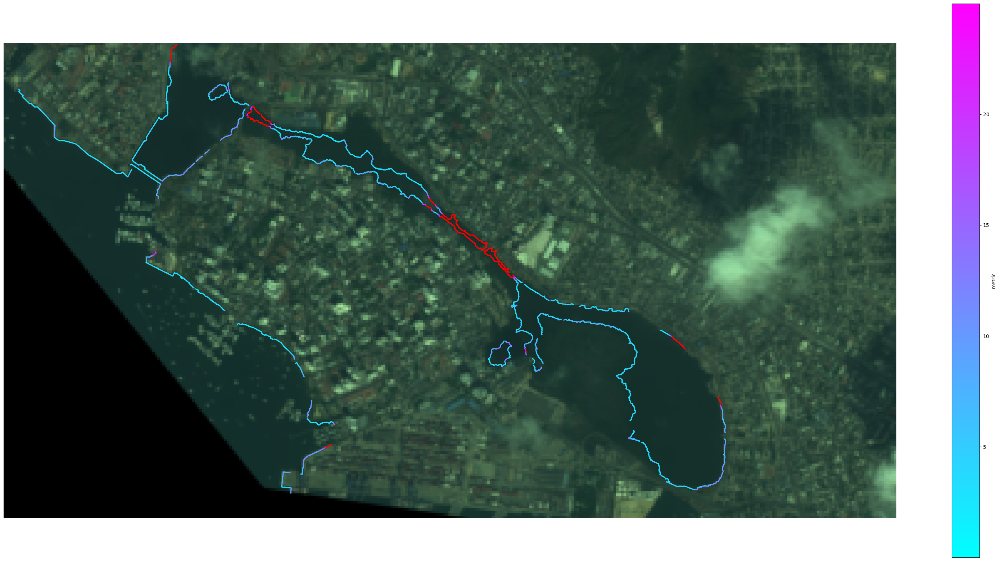

In [587]:
coords_pxl = SDS_tools.convert_world2pix(ref_sl_points[::100], sds_data["georef"])
thresh_func = otsu
im_flat = sim_bands.reshape(-1, sim_bands.shape[-1])
im_ind = ewi(im_flat).reshape(sim_bands.shape[:-1])
lse_contours, lse_thresholds = lse.local_sl_extraction_1(coords_pxl, im_ind, thresh_func, 30, sds_data, False)
lse_shoreline_dist = m.get_nearest_distance(ref_sl_points, lse_contours)
fig = wvep.plot_shoreline_metric(lse_shoreline_dist, (0, 25), ref_sl_points_pxl, im_rgb, contours_pxl=None)

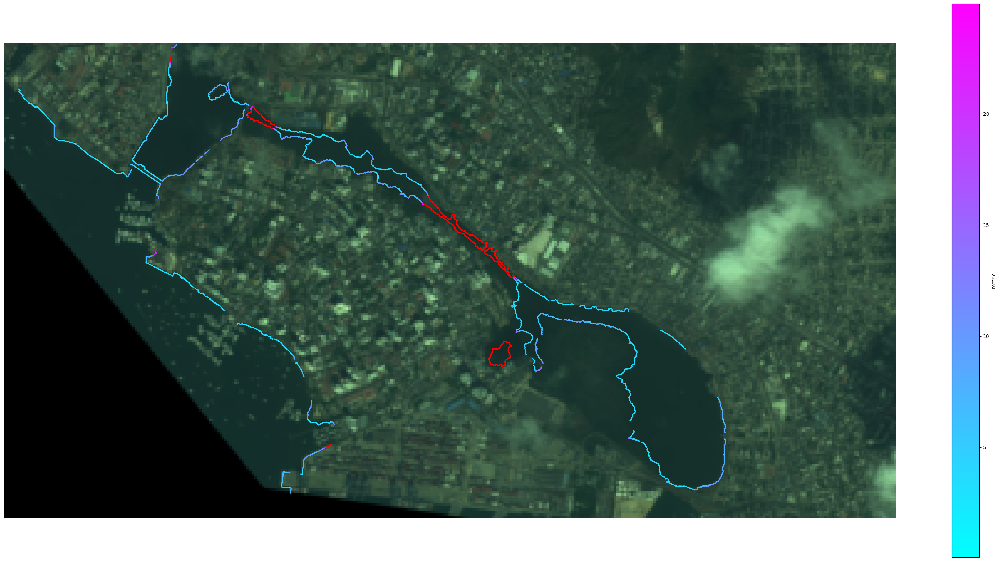

In [588]:
contours = wv_eval.extract_shoreline(sim_bands, ewi, otsu, sds_data)
shoreline_dist = m.get_nearest_distance(ref_sl_points, contours)
fig = wvep.plot_shoreline_metric(shoreline_dist, (0, 25), ref_sl_points_pxl, im_rgb, contours_pxl=None)

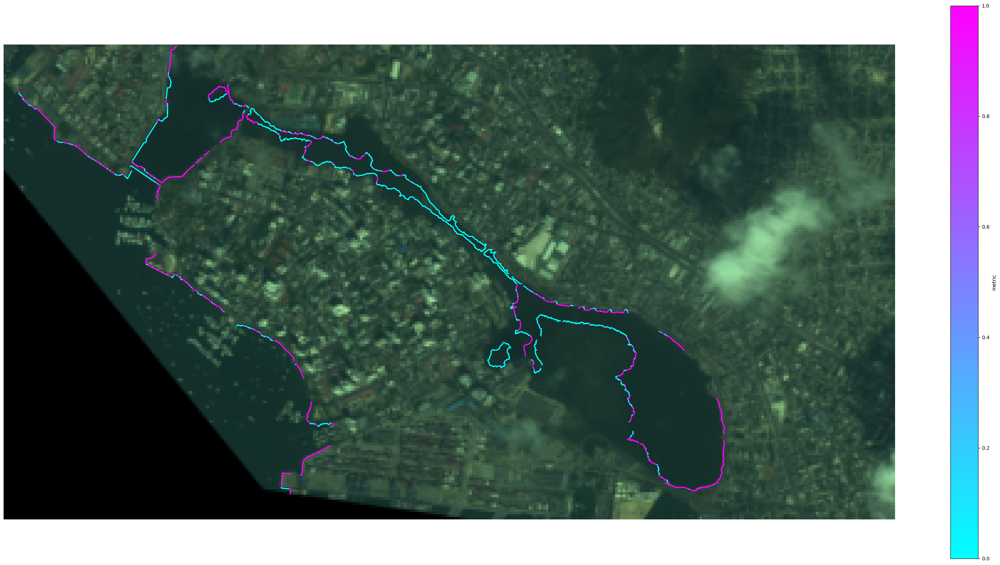

In [589]:
diff = lse_shoreline_dist - shoreline_dist
where_lse_worse = (diff>0).astype(int)
fig = wvep.plot_shoreline_metric(where_lse_worse, (-15, 15), ref_sl_points_pxl, im_rgb, contours_pxl=None)

In [594]:
np.sum(where_lse_worse) / len(where_lse_worse) # ~45% of shoreline is better without lse

np.float64(0.46593886462882095)

In [596]:
print(np.mean(lse_shoreline_dist[lse_shoreline_dist < 25]), np.mean(lse_shoreline_dist))
print(np.mean(shoreline_dist[shoreline_dist < 25]), np.mean(shoreline_dist))

5.730253702671194 17.89784337190124
5.644145848744661 24.020508079987362


In [ ]:
fig, ax = plt.subplots(1, 2)
counts, bins, bar = ax[0].hist(lse_shoreline_dist[where_lse_worse.astype(bool)], color="blue", alpha=0.5)
ax[0].hist(shoreline_dist[where_lse_worse.astype(bool)], color="red", bins=bins, alpha=0.5)
ax[0].set_title("when LSE is worse")

counts, bins, bar = ax[1].hist(lse_shoreline_dist[~where_lse_worse.astype(bool)], color="blue", alpha=0.5)
ax[1].hist(shoreline_dist[~where_lse_worse.astype(bool)], color="red", bins=bins, alpha=0.5)
ax[1].set_title("when LSE is better");

In [ ]:
fig, ax = plt.subplots()
ax.hist(diff[(diff < 25) & (diff > -25)], color="red", bins=256, alpha=0.5)
ax.set_title("LSE - regular");
ax.axvline(0)

In [ ]:
plt.hist(lse_thresholds);

#### LSE debugging

In [ ]:
# plot threshold values for sparse shoreline
lse_contours_pxl = SDS_tools.convert_world2pix(lse_contours, georef)
fig = wvep.plot_shoreline_metric(np.array(lse_thresholds), (-15, 15), coords_pxl, im_rgb, contours_pxl=lse_contours_pxl)

In [ ]:
sds_settings = {
    'output_epsg': image_epsg,
    'max_dist_ref': 400,
    'min_length_sl': 250,
    'dist_clouds': 30,
}

sds_data = dict(
    cloud_mask=cloud_mask,
    sl_buffer=sl_buffer,
    im_nodata=im_nodata,
    georef=georef,
    image_epsg=image_epsg,
    sds_settings=sds_settings
)

In [ ]:
px_idx = 10

ref_tree = KDTree(coords_pxl)
ll_px, ur_px = lse.get_bounding_box_pxl(coords_pxl[px_idx], 30)

# make mask
mask_y_min, mask_y_max, mask_x_min, mask_x_max = lse.get_mask_bounds(ll_px, ur_px, im_ind.shape)
mask = np.zeros(im_ind.shape, dtype=bool)
mask[mask_y_min:mask_y_max, mask_x_min:mask_x_max] = 1 # note: have to swap x and y for indexing
mask &= sds_data["sl_buffer"]

# prep contours
threshold = thresh_func(im_ind, sds_data["cloud_mask"], mask)
contours = modified_coastsat.find_wl_contours1(im_ind, sds_data["cloud_mask"], mask, threshold)

contours = SDS_shoreline.process_shoreline(contours, sds_data["cloud_mask"], sds_data["im_nodata"],
                                sds_data["georef"], sds_data["image_epsg"], sds_data["sds_settings"])
contours_pxl = SDS_tools.convert_world2pix(contours, sds_data["georef"])

# append contour points nearby to reference point (px_idx)
good_contour_pxl = lse.filter_contour_points(contours_pxl, ref_tree, px_idx)

In [ ]:
contours_pxl = np.concatenate(contours)
contours_pxl = contours_pxl[:,[1,0]]
good_contour_pxl = lse.filter_contour_points(contours_pxl, ref_tree, px_idx)

In [ ]:
im = np.zeros_like(im_ind)
im[mask] = im_ind[mask]

fig, ax = plt.subplots(figsize=(12, 8))
p = ax.imshow(im)
ax.axis(False)
ax.scatter(good_contour_pxl[:,0], good_contour_pxl[:,1], s=1, c="white")
# for c in contours:
#     ax.scatter(c[:,1], c[:,0], s=0.5, c="white")
ax.scatter(coords_pxl[:,0], coords_pxl[:,1], s=1, c="black")
ax.scatter(coords_pxl[px_idx,0], coords_pxl[px_idx,1], s=1, c="red")
fig.colorbar(p, ax=ax)

In [ ]:
fig, ax = plt.subplots(1, 1)
ax.hist(im_ind[mask], bins=256)
ax.axvline(threshold)

### Optimal Threshold

Gives small improvement, therefore thresholding methods seem pretty decent. Optimal threshold changes if ignoring/including outliers. This implies that the optimal threshold changes depending on the part of the image (support for a local thresholding methodology). Should refactor so isn't running every index twice (or just remove a thresholding method). Note that ensemble2 results differ as the threshold is applied to each index before binarizing and summing together

In [576]:
index_im = mndwi(sim_bands.reshape(-1, sim_bands.shape[-1])).reshape(sim_bands.shape[:-1])
ignore_outliers_contours, ignore_outliers_threshold = wv_eval.get_optimal_threshold(index_im, ref_sl_points, sds_data, step_size=0.01, ignore_outliers=True)

ignore_outliers_dists = m.get_nearest_distance(ref_sl_points, ignore_outliers_contours)
print(np.mean(ignore_outliers_dists))
print(np.mean(ignore_outliers_dists[ignore_outliers_dists < 25]))

21.57750804103411
6.46361823599095


In [577]:
index_im = mndwi(sim_bands.reshape(-1, sim_bands.shape[-1])).reshape(sim_bands.shape[:-1])
outliers_contours, outliers_threshold = wv_eval.get_optimal_threshold(index_im, ref_sl_points, sds_data, step_size=0.01, ignore_outliers=False)

outliers_dists = m.get_nearest_distance(ref_sl_points, outliers_contours)
print(np.mean(outliers_dists))
print(np.mean(outliers_dists[outliers_dists < 25]))

9.723213084284188
6.868375860205109


In [ ]:
otsu_contour = wv_eval.get_contours(index_im, otsu(index_im, cloud_mask, sl_buffer), sds_data)
dists = m.get_nearest_distance(ref_sl_points, otsu_contour)
print(np.mean(dists))
print(np.mean(dists[dists < 25]))

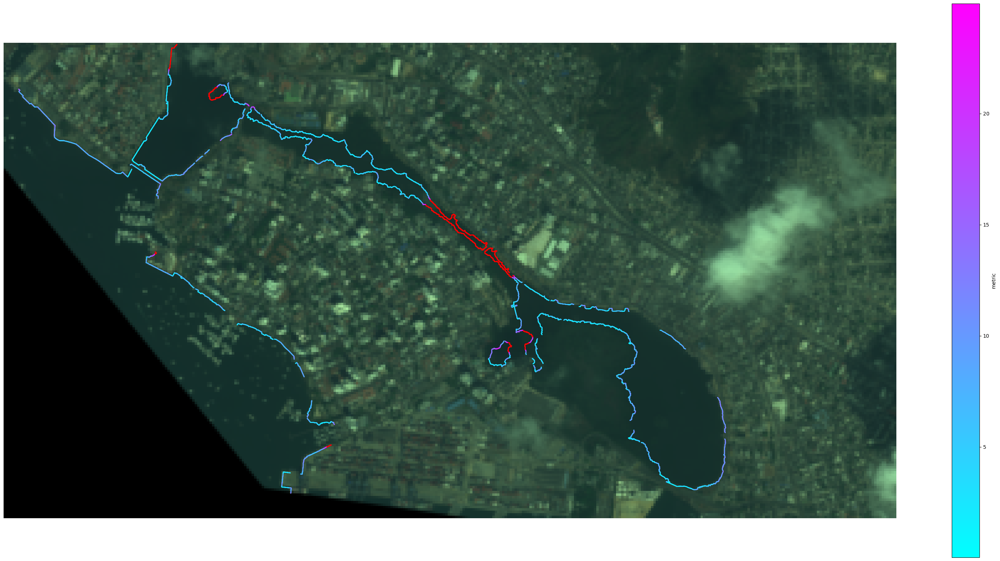

In [581]:
fig = wvep.plot_shoreline_metric(ignore_outliers_dists, (0, 25), ref_sl_points_pxl, im_rgb, contours_pxl=ignore_outliers_contours)

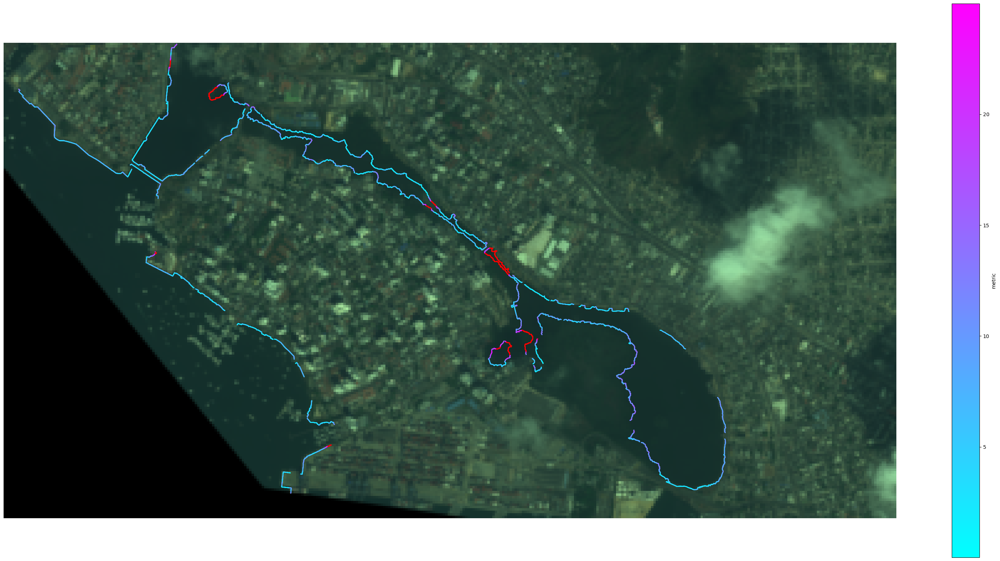

In [582]:
fig = wvep.plot_shoreline_metric(outliers_dists, (0, 25), ref_sl_points_pxl, im_rgb, contours_pxl=outliers_contours)

In [ ]:
contours_pxl = SDS_tools.convert_world2pix(outliers_contours, georef)
fig = wvep.plot_shoreline_metric(outliers_dists, (0, 25), ref_sl_points_pxl, im_rgb, contours_pxl)

In [ ]:
shoreline_metric, transect_metric, methods, info = wv_eval.evaluate_methods(
    index_functions, threshold_functions, sim_bands, ref_sl_points, transects, collider_settings, sds_data, ensemble_idx_funcs, optimal_thresholds=True
)
entries = wv_eval.organize_metrics(shoreline_metric, transect_metric, methods)

In [ ]:
wv_eval.print_metrics(entries, "sl_mean")

### Local Thresholding (Take 2)

In [95]:
coords_pxl = SDS_tools.convert_world2pix(ref_sl_points[::100], sds_data["georef"])
im_ind = ewi(sim_bands.reshape(-1,sim_bands.shape[-1])).reshape(sim_bands.shape[:-1])

In [96]:
zone_indicators = lse.get_zone_indicators(im_ind, coords_pxl, sds_data, buffer_size=50, p_thresh=0.05)
masks = lse.get_masks_from_zone_indicators(zone_indicators, coords_pxl, sim_bands.shape[:-1])

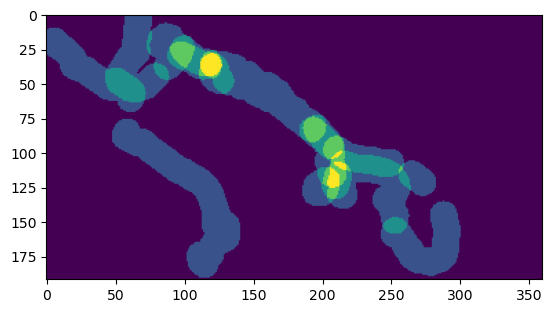

In [97]:
mask_sum = np.sum([mask for mask in masks], axis=0)
plt.imshow(mask_sum)

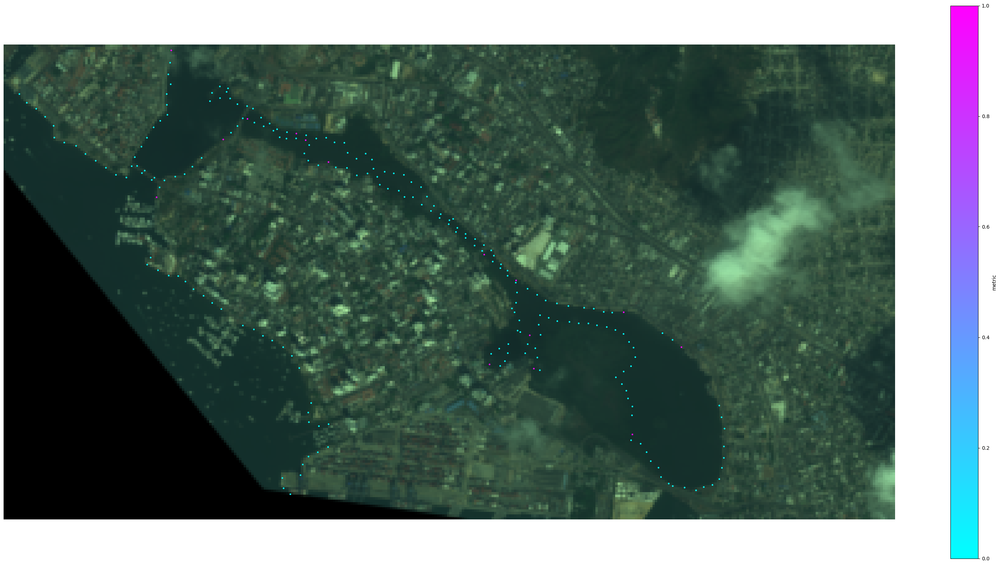

In [98]:
fig = wvep.plot_shoreline_metric(zone_indicators.astype(int), (-1, 200), coords_pxl, im_rgb, s=5)
# fig = wvep.plot_shoreline_metric(zones, (-1, 200), coords_pxl, im_rgb, s=5)

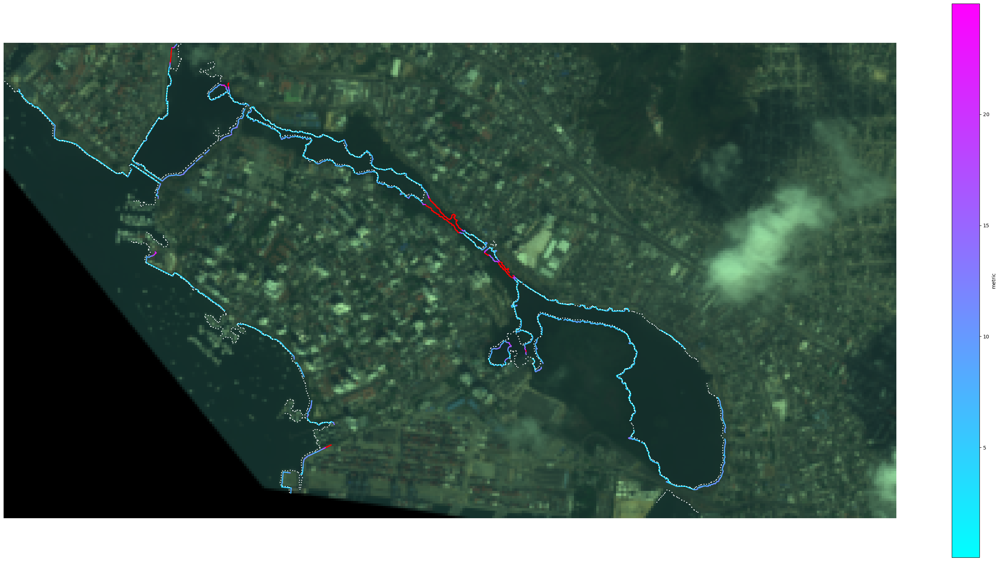

In [111]:
# contour_world, _ = lse.local_sl_extraction_2(masks, thresh_func, im_ind, sds_data)
contour_world, _ = lse.local_sl_extraction_2(masks, thresh_func, im_ind, np.cumsum(zone_indicators), coords_pxl, sds_data)
dists = m.get_nearest_distance(ref_sl_points, contour_world)
contour_pxl = SDS_tools.convert_world2pix(contour_world, georef)
fig = wvep.plot_shoreline_metric(dists, (0, 25), ref_sl_points_pxl, im_rgb, contours_pxl=contour_pxl)

In [112]:
print(np.mean(dists))
print(np.mean(dists[dists < 25]))

9.119656876721388
5.689274942248014


In [131]:
shoreline_metric, transect_metric, methods, info = wv_eval.evaluate_methods(
    index_functions, threshold_functions, sim_bands, ref_sl_points, transects, collider_settings, sds_data, ensemble_idx_funcs
)
entries, outlier_idx = wv_eval.organize_metrics(shoreline_metric, transect_metric, methods)

lse2_shoreline_metric, lse2_transect_metric, methods, info = wv_eval.evaluate_methods(
    index_functions, threshold_functions, sim_bands, ref_sl_points, transects, collider_settings, sds_data, ensemble_idx_funcs, lse2=True
)
lse2_entries, _ = wv_eval.organize_metrics(lse2_shoreline_metric, lse2_transect_metric, methods, outlier_idx)

30it [00:12,  2.32it/s]
30it [00:15,  1.94it/s]


In [132]:
sort_var = "sl_mean"
wv_eval.print_metrics(entries, sort_var)
print("\n")
wv_eval.print_metrics(lse2_entries, sort_var)

                                    sl_mean      sl_mean_all  sl_std       sl_outlier     t_mean       t_std        t_mae       
ensemble2__otsu:                    5.023        7.845        2.652        1189           1.019        3.930        3.073       
ensemble1__otsu:                    5.403        10.191       2.839        1725           0.198        5.625        3.727       
ewi__otsu:                          5.464        10.438       3.176        1860           0.605        3.906        2.727       
andwi__otsu:                        5.503        10.329       2.959        1740           1.387        3.522        2.941       
nwi__otsu:                          5.816        10.848       3.223        1834           1.691        3.697        3.176       
tct_wetness__local_min_otsu:        6.401        11.840       3.950        2149           2.207        4.518        3.943       
mndwi__local_min_otsu:              6.443        9.698        3.838        1506           1.873  

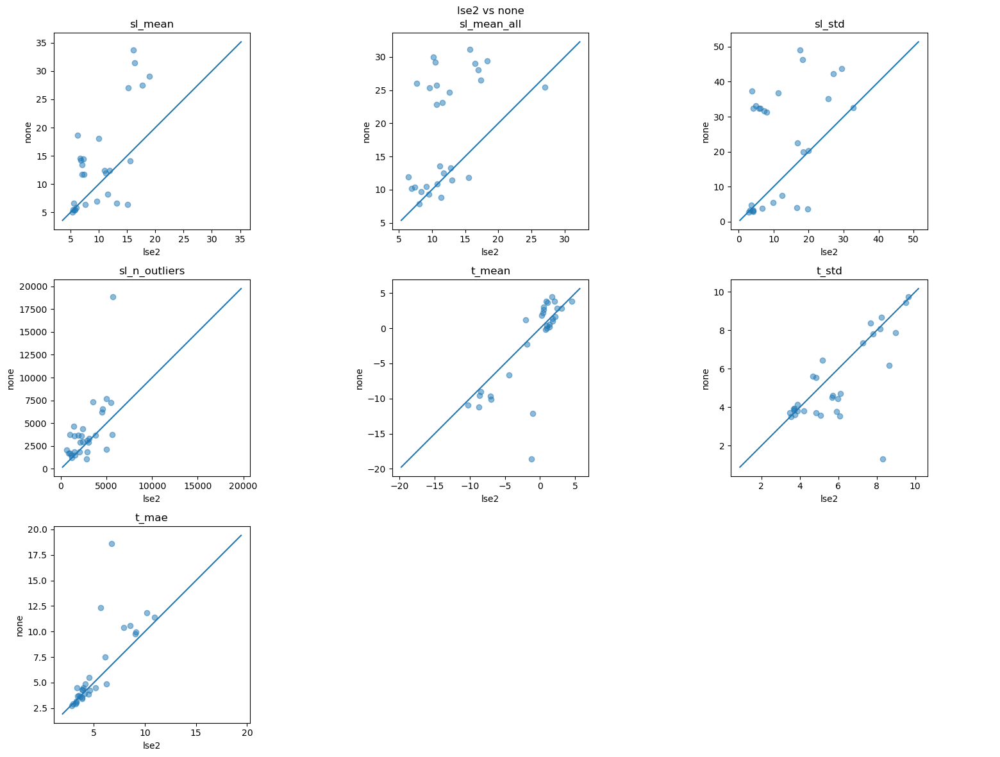

In [133]:
metrics = list(entries[0].keys())[1:]
fig = wvep.plot_comparison(lse2_entries, entries, "lse2", "none", metrics)

In [647]:
thresh_func = otsu
im_flat = sim_bands.reshape(-1, sim_bands.shape[-1])
im_ind = ewi(im_flat).reshape(sim_bands.shape[:-1])

zone_indicators = lse.get_zone_indicators(im_ind, coords_pxl, sds_data, buffer_size=50, p_thresh=0.05)
masks = lse.get_masks_from_zone_indicators(zone_indicators, coords_pxl, sim_bands.shape[:-1])
lse2_contours, _ = lse.local_sl_extraction_2(masks, thresh_func, im_ind, sds_data)
lse_shoreline_dist2 = m.get_nearest_distance(ref_sl_points, lse2_contours)

lse1_contours, _ = lse.local_sl_extraction_1(coords_pxl, im_ind, thresh_func, 30, sds_data, False)
lse_shoreline_dist1 = m.get_nearest_distance(ref_sl_points, lse_contours)

contours = wv_eval.extract_shoreline(sim_bands, ewi, thresh_func, sds_data)
shoreline_dist = m.get_nearest_distance(ref_sl_points, contours)

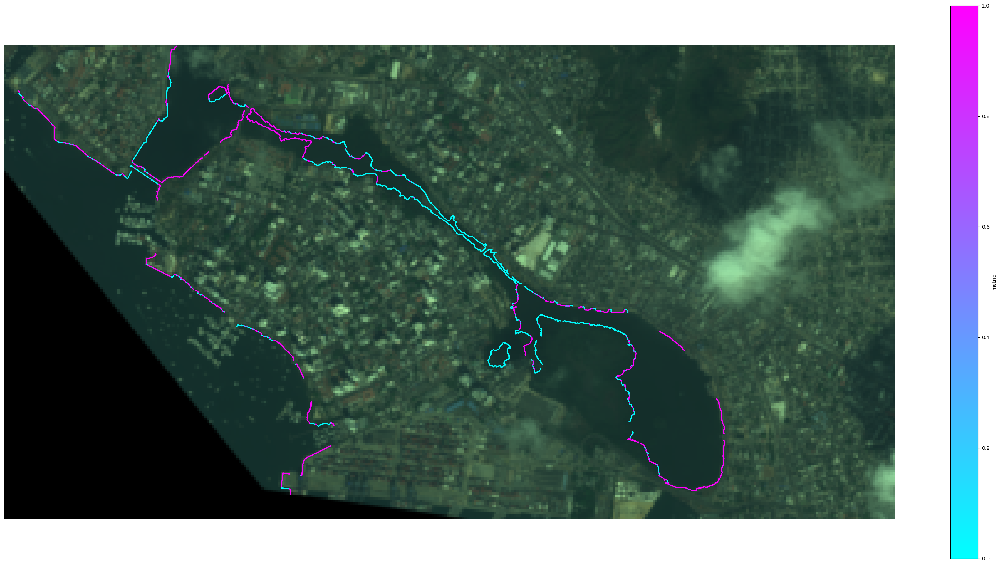

In [648]:
diff = lse_shoreline_dist2 - shoreline_dist
where_lse_worse = (diff>0).astype(int)
fig = wvep.plot_shoreline_metric(where_lse_worse, (-15, 15), ref_sl_points_pxl, im_rgb, contours_pxl=None)

In [649]:
print(f"{'LSE Take 2:'.ljust(15)}{np.mean(lse_shoreline_dist2[lse_shoreline_dist2 < 25]):.3f}, {np.mean(lse_shoreline_dist2):.3f}")
print(f"{'LSE Take 1:'.ljust(15)}{np.mean(lse_shoreline_dist1[lse_shoreline_dist1 < 25]):.3f}, {np.mean(lse_shoreline_dist1):.3f}")
print(f"{'original:'.ljust(15)}{np.mean(shoreline_dist[shoreline_dist < 25]):.3f}, {np.mean(shoreline_dist):.3f}")

LSE Take 2:    5.858, 23.337
LSE Take 1:    5.730, 17.898
original:      5.644, 24.021


### Hand Partitioning (Local Extraction Sanity Check)

(229,)


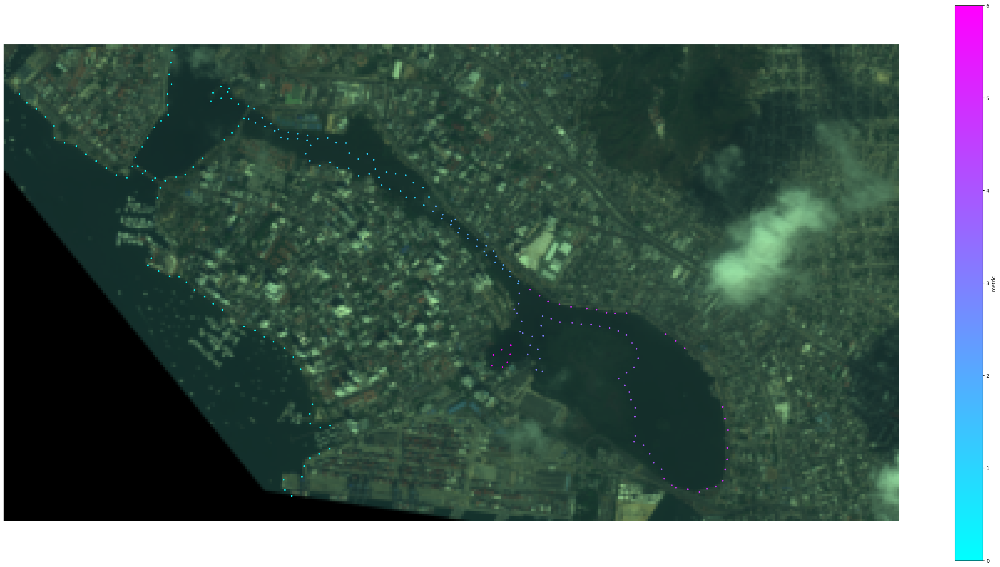

In [122]:
coords_pxl = ref_sl_points_pxl[::100]
zone_indicators = np.zeros((len(coords_pxl)), dtype=int)
print(zone_indicators.shape)
zone_indicators[:81] = 0
zone_indicators[81:105] = 1
zone_indicators[105:120] = 2
zone_indicators[120:142] = 1
zone_indicators[142:147] = 2
zone_indicators[147:164] = 3
zone_indicators[164:190] = 4
zone_indicators[190:217] = 5
zone_indicators[217:222] = 2
zone_indicators[222:] = 6

fig = wvep.plot_shoreline_metric(zone_indicators, (-1, 200), coords_pxl, im_rgb, s=5)

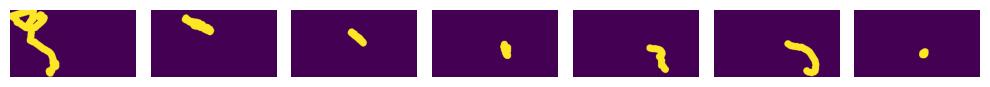

In [124]:
sanity_masks = lse.get_masks_from_zone_indicators(zone_indicators, coords_pxl, sim_bands.shape[:-1])

fig, axs = plt.subplots(1, len(sanity_masks), tight_layout=True, figsize=(10, 5))
for i, mask in enumerate(sanity_masks):
    axs[i].imshow(mask)
    axs[i].axis(False)

original:      5.464, 10.438
sanity check:  5.348, 6.244


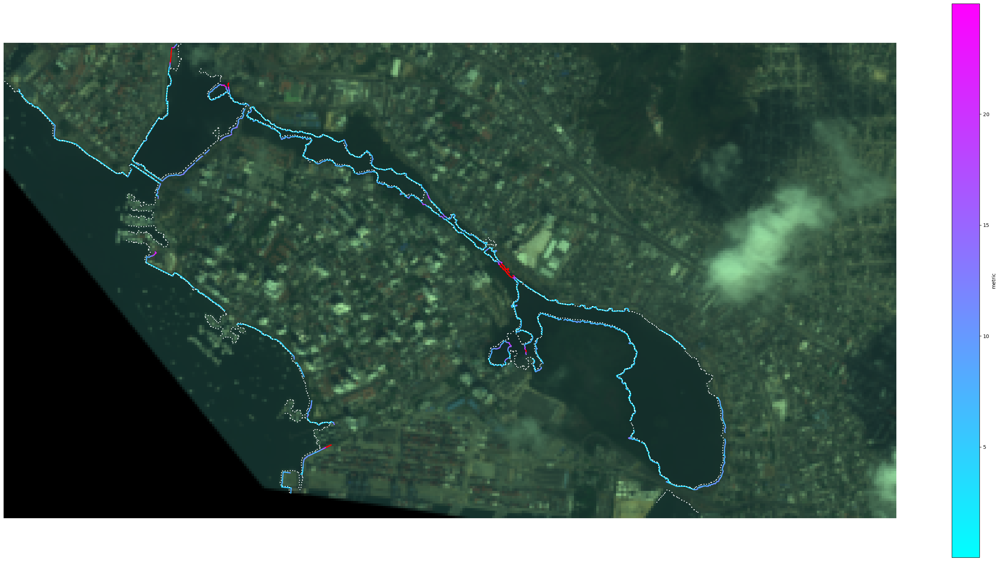

In [127]:
thresh_func = otsu
index_fn = ewi
im_flat = sim_bands.reshape(-1, sim_bands.shape[-1])
im_ind = index_fn(im_flat).reshape(sim_bands.shape[:-1])

original_contours = wv_eval.extract_shoreline(sim_bands, index_fn, thresh_func, sds_data)
shoreline_dist = m.get_nearest_distance(ref_sl_points, original_contours)

sanity_contours, _ = lse.local_sl_extraction_2(sanity_masks, thresh_func, im_ind, zone_indicators, coords_pxl, sds_data)
sanity_shoreline_dist = m.get_nearest_distance(ref_sl_points, sanity_contours)

print(f"{'original:'.ljust(15)}{np.mean(shoreline_dist[~outlier_idx]):.3f}, {np.mean(shoreline_dist):.3f}")
print(f"{'sanity check:'.ljust(15)}{np.mean(sanity_shoreline_dist[~outlier_idx]):.3f}, {np.mean(sanity_shoreline_dist):.3f}")

contour_pxl = SDS_tools.convert_world2pix(sanity_contours, georef)
fig = wvep.plot_shoreline_metric(sanity_shoreline_dist, (0, 25), ref_sl_points_pxl, im_rgb, contours_pxl=contour_pxl)

In [135]:
shoreline_metric, transect_metric, methods, info = wv_eval.evaluate_methods(
    index_functions, threshold_functions, sim_bands, ref_sl_points, transects, collider_settings, sds_data, ensemble_idx_funcs
)
entries, outlier_idx = wv_eval.organize_metrics(shoreline_metric, transect_metric, methods)

lse_sanity_shoreline_metric, lse_sanity_transect_metric, methods, info = wv_eval.evaluate_methods(
    index_functions, threshold_functions, sim_bands, ref_sl_points, transects, collider_settings, sds_data, ensemble_idx_funcs, lse2=True, zones=zone_indicators
)
lse_sanity_entries, _ = wv_eval.organize_metrics(lse_sanity_shoreline_metric, lse_sanity_transect_metric, methods, outlier_idx)


30it [00:14,  2.14it/s]
30it [00:15,  1.97it/s]


In [136]:
sort_var = "sl_mean"

wv_eval.print_metrics(lse_sanity_entries, sort_var)
print('\n')
wv_eval.print_metrics(entries, sort_var)

                                    sl_mean      sl_mean_all  sl_std       sl_outlier     t_mean       t_std        t_mae       
ensemble2__otsu:                    5.048        7.868        2.668        1189           1.196        3.869        3.106       
ewi__otsu:                          5.348        6.244        3.324        525            1.232        3.249        2.564       
ndwi__otsu:                         5.534        6.375        3.744        643            0.791        4.564        3.199       
ensemble1__otsu:                    5.652        6.369        4.304        586            0.748        5.046        3.426       
andwi__otsu:                        5.754        6.499        4.135        576            1.806        3.598        3.095       
nwi__otsu:                          5.888        8.941        4.124        1523           1.808        3.485        3.103       
ensemble1__local_min_otsu:          6.197        7.301        5.083        890            1.525  

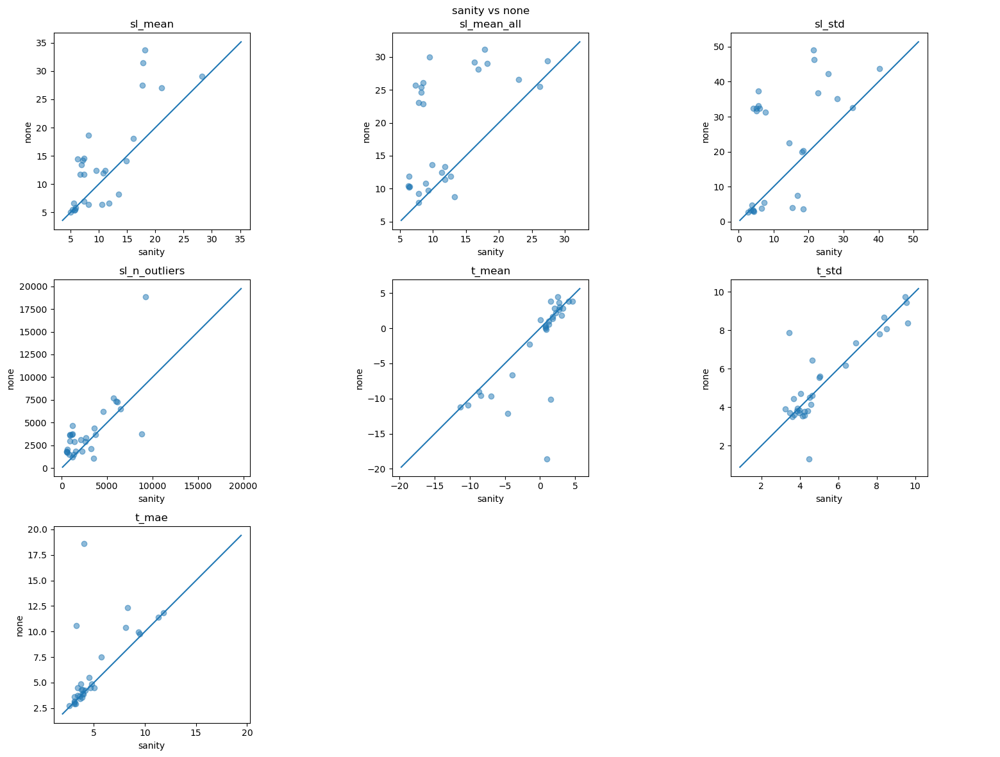

In [137]:
metrics = list(entries[0].keys())[1:]
fig = wvep.plot_comparison(lse_sanity_entries, entries, "sanity", "none", metrics, sl_lim=100)

#### Sanity Masks and Optimal Thresholds

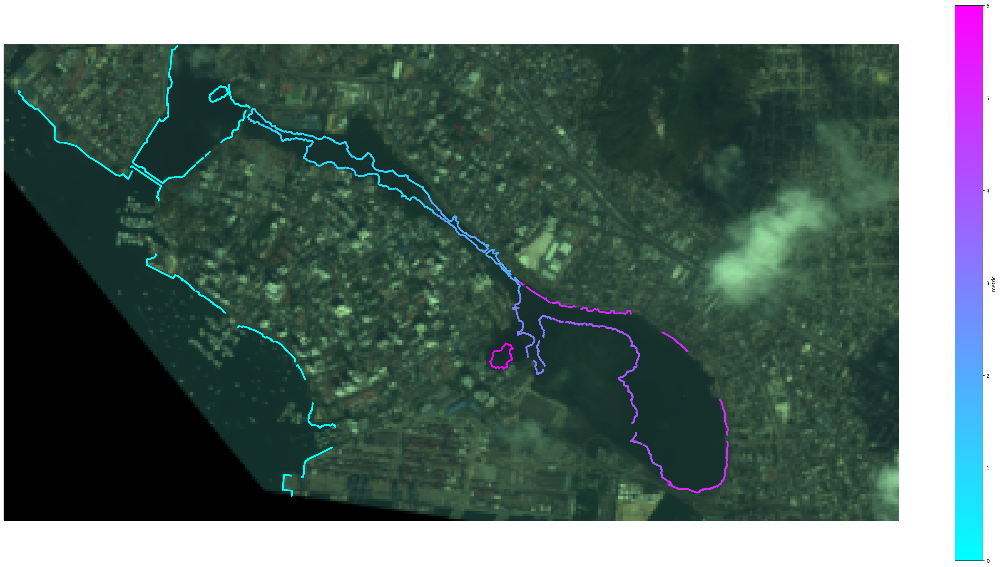

In [1163]:
zone_indicators = np.zeros((len(ref_sl_points_pxl)), dtype=int)

# zone indicators for full ref_sl (not coords, which is only every 100 points)
conv_factor = 100
zone_indicators[:81*conv_factor] = 0
zone_indicators[81*conv_factor:105*conv_factor] = 1
zone_indicators[105*conv_factor:120*conv_factor] = 2
zone_indicators[120*conv_factor:142*conv_factor] = 1
zone_indicators[142*conv_factor:147*conv_factor] = 2
zone_indicators[147*conv_factor:164*conv_factor] = 3
zone_indicators[164*conv_factor:190*conv_factor] = 4
zone_indicators[190*conv_factor:217*conv_factor] = 5
zone_indicators[217*conv_factor:222*conv_factor] = 2
zone_indicators[222*conv_factor:] = 6

fig = wvep.plot_shoreline_metric(zone_indicators, (-1, 200), ref_sl_points_pxl, im_rgb, s=5)

In [ ]:
# prepare index
im_flat = sim_bands.reshape(-1, sim_bands.shape[-1])
im_ind = ewi(im_flat).reshape(sim_bands.shape[:-1])

# select mask/zone
mask_num = 3
zone_idx = zone_indicators == mask_num
sds_data_temp = sds_data.copy()
sds_data_temp["sl_buffer"] = sanity_masks[mask_num]

# calculate thresholds and contours
optim_contour, optim_thresh = wv_eval.get_optimal_threshold(im_ind, ref_sl_points[zone_idx], sds_data_temp, step_size=0.01, ignore_outliers=False)

global_otsu_thresh = otsu(im_ind, cloud_mask, sl_buffer)
global_otsu_contour = wv_eval.get_contours(im_ind, global_otsu_thresh, sds_data_temp)

local_otsu_thresh = otsu(im_ind, cloud_mask, sanity_masks[mask_num])
local_otsu_contour = wv_eval.get_contours(im_ind, local_otsu_thresh, sds_data_temp)

global_lmo_thresh = local_min_otsu(im_ind, cloud_mask, sl_buffer)
global_lmo_contour = wv_eval.get_contours(im_ind, global_lmo_thresh, sds_data_temp)

local_lmo_thresh = local_min_otsu(im_ind, cloud_mask, sanity_masks[mask_num])
local_lmo_contour = wv_eval.get_contours(im_ind, local_lmo_thresh, sds_data_temp)

# evaluate metrics
optim_dist = m.get_nearest_distance(ref_sl_points[zone_idx], optim_contour)
global_otsu_dist = m.get_nearest_distance(ref_sl_points[zone_idx], global_otsu_contour)
global_lmo_dist = m.get_nearest_distance(ref_sl_points[zone_idx], global_lmo_contour)
local_otsu_dist = m.get_nearest_distance(ref_sl_points[zone_idx], local_otsu_contour)
local_lmo_dist = m.get_nearest_distance(ref_sl_points[zone_idx], local_lmo_contour)

# print results
print(f"optim: {np.mean(optim_dist)}, t:{optim_thresh}")
print(f"global otsu: {np.mean(global_otsu_dist)}, t:{global_otsu_thresh}")
print(f"global lmo: {np.mean(global_lmo_dist)}, t:{global_lmo_thresh}")
print(f"local otsu: {np.mean(local_otsu_dist)}, t:{local_otsu_thresh}")
print(f"local lmo: {np.mean(local_lmo_dist)}, t:{local_lmo_thresh}")

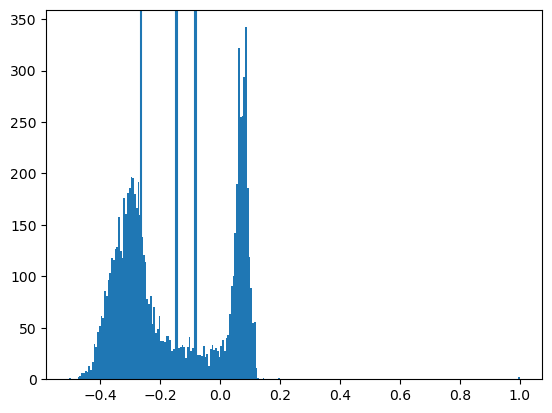

In [962]:
fig, ax = plt.subplots()
ax.hist(im_ind[sanity_masks[0]], bins=256)
ax.axvline(optim_thresh)
ax.axvline(local_otsu_thresh)
ax.axvline(global_otsu_thresh)
ax.axvline(local_lmo_thresh)
ax.axvline(global_lmo_thresh)


In [ ]:
thresholds = []
final_contour = []

sds_data_temp = sds_data.copy()
mask_bin = sanity_masks.astype(bool)
for i, mask in enumerate(mask_bin):
    sds_data_temp["sl_buffer"] = mask
    zone_idx = zone_indicators == i
    optim_contour, optim_thresh = wv_eval.get_optimal_threshold(im_ind, ref_sl_points[zone_idx], sds_data_temp, step_size=0.01, ignore_outliers=False)
    thresholds.append(optim_thresh)
    if len(contours_pxl) > 0: final_contour.append(optim_contour)
    
final_contour = np.concatenate(final_contour)

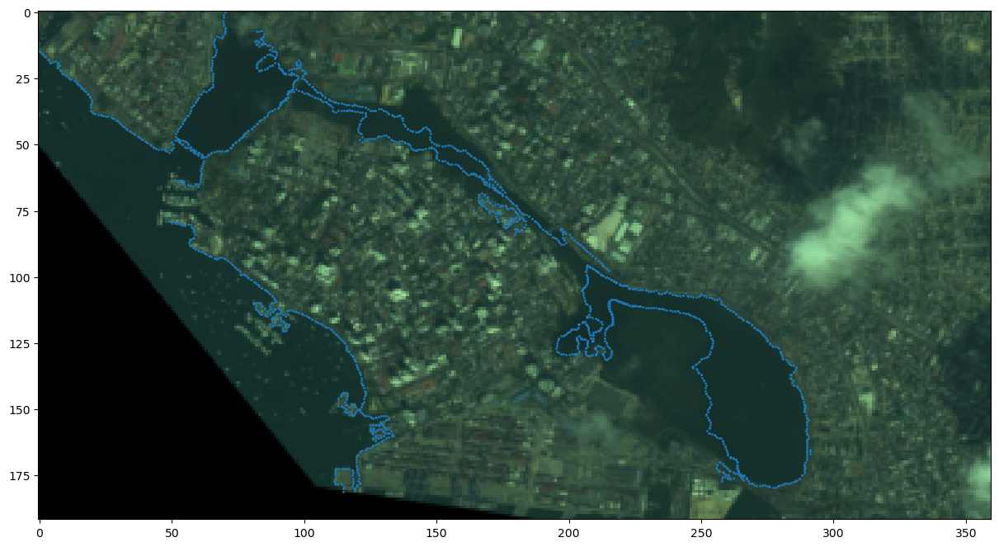

In [1007]:
fig, axs = plt.subplots(figsize=(16, 8))
axs.imshow(im_rgb)

final_contour_pxl = SDS_tools.convert_world2pix(final_contour, georef)
axs.scatter(final_contour_pxl[:,0], final_contour_pxl[:,1], s=1)

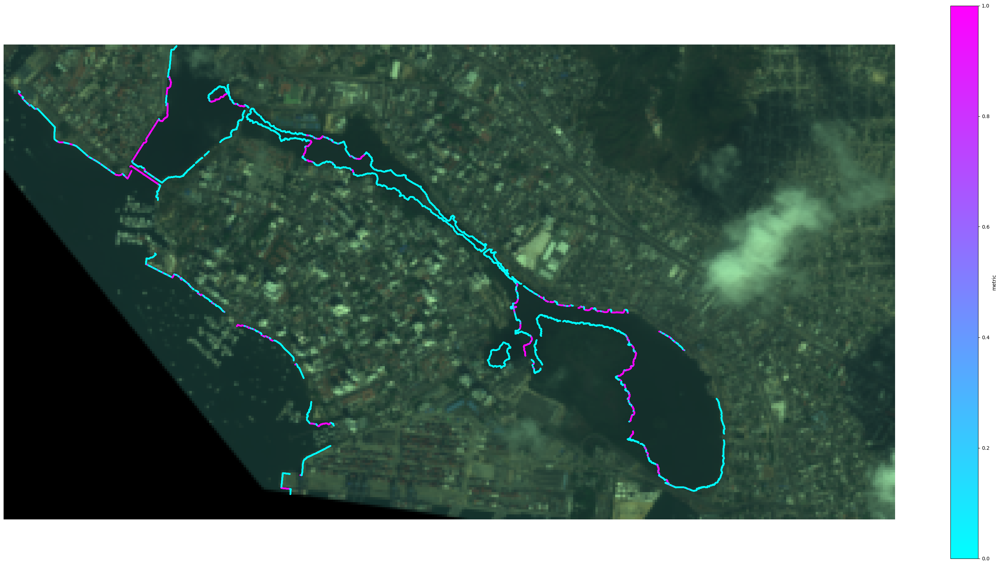

In [1020]:
global_lmo_thresh = local_min_otsu(im_ind, cloud_mask, sl_buffer)
global_lmo_contour = wv_eval.get_contours(im_ind, global_lmo_thresh, sds_data)

local_otsu_dist = m.get_nearest_distance(ref_sl_points, global_lmo_contour)
local_optim_dist = m.get_nearest_distance(ref_sl_points, final_contour)
where_optim_worse = ((local_optim_dist - local_otsu_dist) > 0).astype(int)

fig = wvep.plot_shoreline_metric(where_optim_worse, (-1, 25), ref_sl_points_pxl, im_rgb, s=5)

In [1008]:
print(thresholds)

[np.float64(-0.16457760334014893), np.float64(-0.23774218559265137), np.float64(-0.3077421188354492), np.float64(-0.1769638955593109), np.float64(-0.23531588912010193), np.float64(-0.19696387648582458), np.float64(-0.17916369438171387)]


In [8]:
# get outlier_idx
shoreline_metric, transect_metric, methods, info = wv_eval.evaluate_methods(
    index_functions, threshold_functions, sim_bands, ref_sl_points, transects, collider_settings, sds_data, ensemble_idx_funcs
)
_, outlier_idx = wv_eval.organize_metrics(shoreline_metric, transect_metric, methods)

30it [00:13,  2.29it/s]


In [1018]:
local_optim_dist = m.get_nearest_distance(ref_sl_points, final_contour)
print(f"local optim: {np.mean(local_optim_dist[~outlier_idx])}, {np.mean(local_optim_dist)}")

local optim: 4.687187148258186, 5.970202388509174


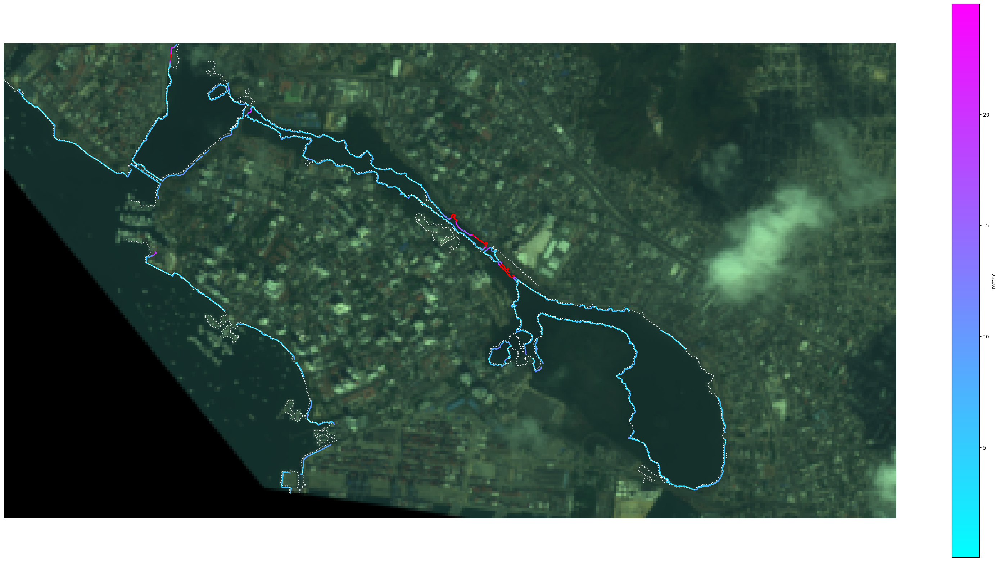

In [1010]:
contour_pxl = SDS_tools.convert_world2pix(final_contour, georef)
fig = wvep.plot_shoreline_metric(local_optim_dist, (0, 25), ref_sl_points_pxl, im_rgb, contours_pxl=contour_pxl)

### Difficult Indices (to replace outlier) for more uniform comparisons

In [793]:
shoreline_metric, transect_metric, methods, info = wv_eval.evaluate_methods(
    index_functions, threshold_functions, sim_bands, ref_sl_points, transects, collider_settings, sds_data, ensemble_idx_funcs
)
entries, outlier_idx = wv_eval.organize_metrics(shoreline_metric, transect_metric, methods)

30it [00:23,  1.28it/s]


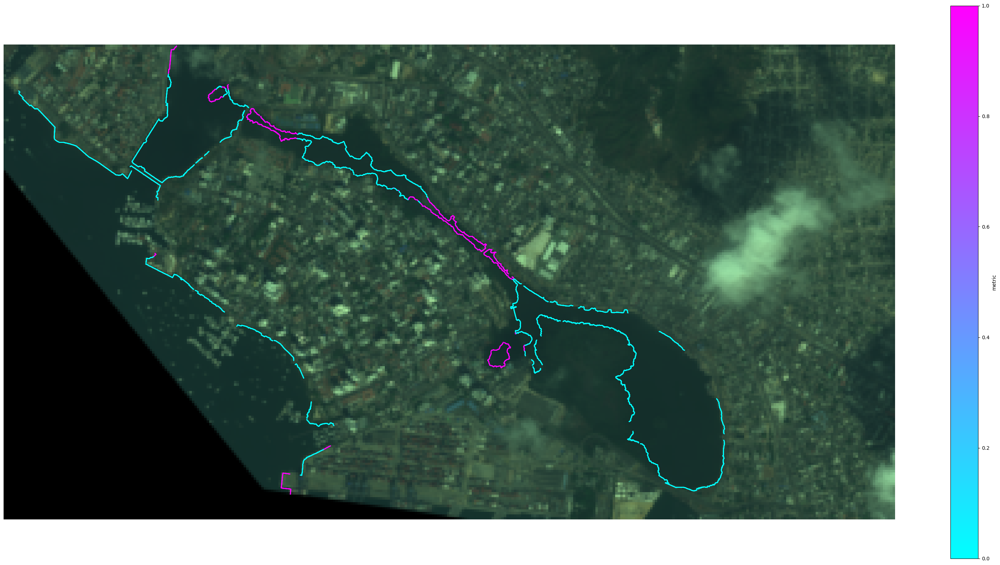

In [735]:
outlier_counts = np.sum(shoreline_metric > 25, axis=0)
outlier_idx = outlier_counts > 10
fig = wvep.plot_shoreline_metric(outlier_idx.astype(int), (0, 25), ref_sl_points_pxl, im_rgb)

In [ ]:
thresh_func = otsu
im_flat = sim_bands.reshape(-1, sim_bands.shape[-1])
im_ind = ewi(im_flat).reshape(sim_bands.shape[:-1])

contours = wv_eval.extract_shoreline(sim_bands, ewi, otsu, sds_data)
shoreline_dist = m.get_nearest_distance(ref_sl_points, contours)

sanity_contours, _ = lse.local_sl_extraction_2(sanity_masks, thresh_func, im_ind, sds_data)
sanity_shoreline_dist = m.get_nearest_distance(ref_sl_points, sanity_contours)

zone_indicators = lse.get_zone_indicators(im_ind, coords_pxl, sds_data, buffer_size=50, p_thresh=0.05)
masks = lse.get_masks_from_zone_indicators(zone_indicators, coords_pxl, sim_bands.shape[:-1])
lse2_contours, _ = lse.local_sl_extraction_2(masks, thresh_func, im_ind, sds_data)
lse_shoreline_dist2 = m.get_nearest_distance(ref_sl_points, lse2_contours)

lse1_contours, _ = lse.local_sl_extraction_1(coords_pxl, im_ind, thresh_func, 30, sds_data, False)
lse_shoreline_dist1 = m.get_nearest_distance(ref_sl_points, lse_contours)

In [762]:
print(f"{'original:'.ljust(15)}{np.mean(shoreline_dist[~outlier_idx]):.3f}, {np.mean(shoreline_dist):.3f}")
print(f"{'LSE Take 2:'.ljust(15)}{np.mean(lse_shoreline_dist2[~outlier_idx]):.3f}, {np.mean(lse_shoreline_dist2):.3f}")
print(f"{'LSE Take 1:'.ljust(15)}{np.mean(lse_shoreline_dist1[~outlier_idx]):.3f}, {np.mean(lse_shoreline_dist1):.3f}")
print(f"{'sanity check:'.ljust(15)}{np.mean(sanity_shoreline_dist[~outlier_idx]):.3f}, {np.mean(sanity_shoreline_dist):.3f}")

original:      5.332, 24.021
LSE Take 2:    7.732, 23.337
LSE Take 1:    5.911, 17.898
sanity check:  5.242, 6.854


### Shorelines for varying thresholds

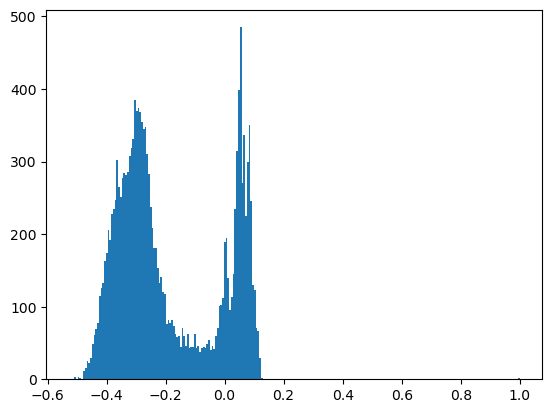

In [1023]:
im_flat = sim_bands.reshape(-1, sim_bands.shape[-1])
im_ind = ewi(im_flat).reshape(sim_bands.shape[:-1])
plt.hist(im_ind[sl_buffer], bins=256);

In [1040]:
thresholds = np.linspace(-0.2, 0, 20)
colours = (thresholds + 0.2) / 0.2

contours = []
for thresh in thresholds:
    contours.append(wv_eval.get_contours(im_ind, thresh, sds_data))

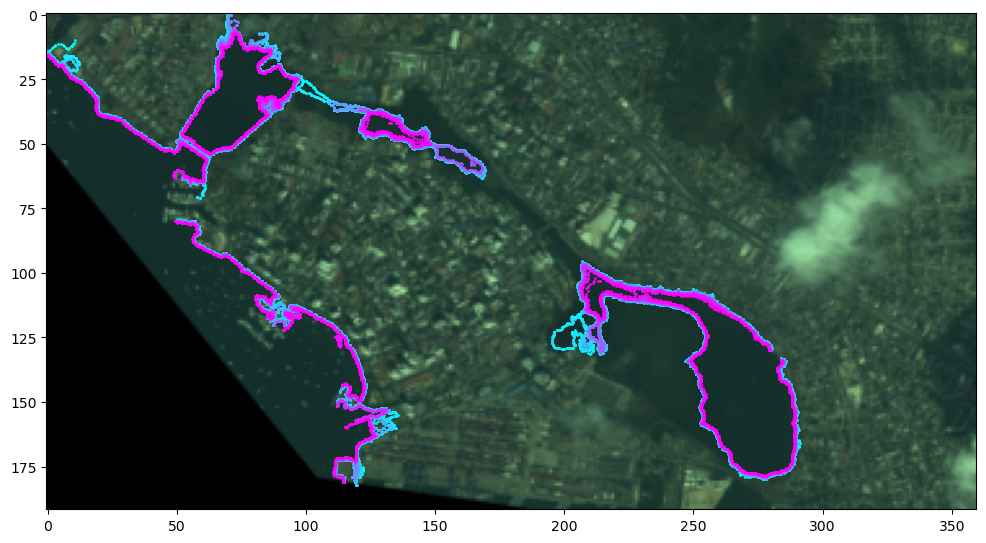

In [1041]:
fig, axs = plt.subplots(figsize=(12, 8))
cmap = mpl.cm.cool

for c, col in zip(contours, colours):
    c_pxl = SDS_tools.convert_world2pix(c, georef)
    axs.scatter(c_pxl[:,0], c_pxl[:,1], s=1, c=cmap(col))
axs.imshow(im_rgb)

### Spectral Unmixing or something

0.4609375


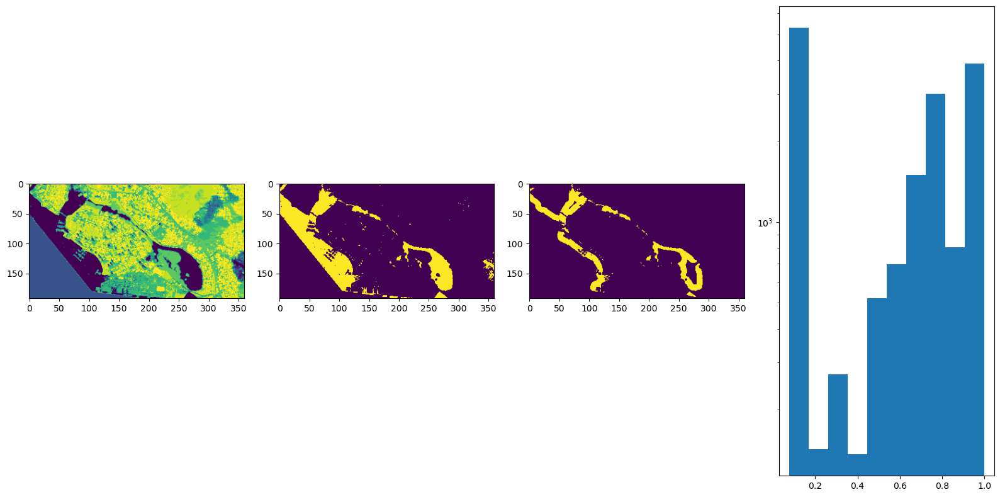

In [4]:
im_ind = ensemble2(sim_bands, ensemble_idx_funcs, otsu, cloud_mask, sl_buffer)
print(otsu(im_ind, cloud_mask, sl_buffer))

fig, ax = plt.subplots(1, 4, figsize=(16, 8), tight_layout=True)
ax[0].imshow(im_ind)
ax[1].imshow(im_ind < 0.2)
ax[2].imshow(sl_buffer & (im_ind < 0.2))
ax[3].hist(im_ind[sl_buffer], log=True);

In [74]:
im_ind = ensemble2(sim_bands, ensemble_idx_funcs, otsu, cloud_mask, sl_buffer)
percentages = su.spectral_unmixing_1(sim_bands, im_ind, sl_buffer, sds_data)

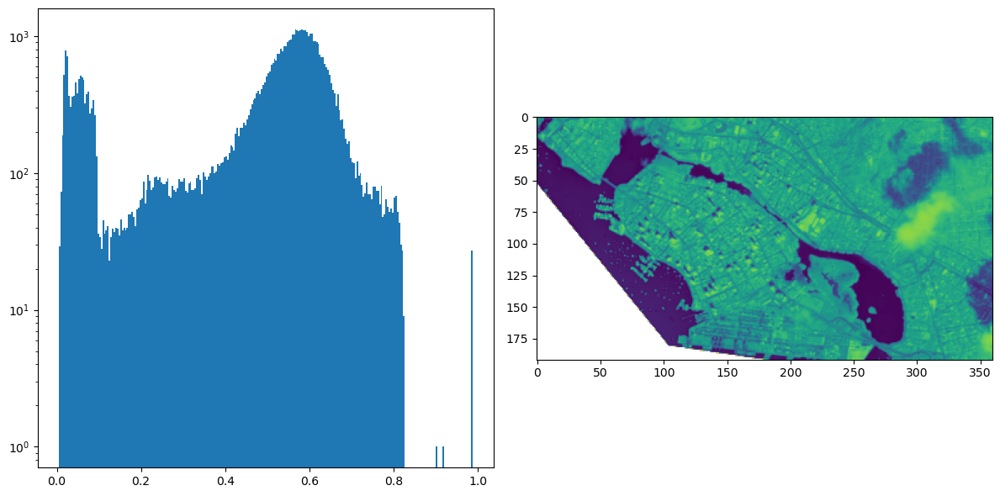

In [75]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6), tight_layout=True)
ax[0].hist(np.ma.masked_invalid(percentages).ravel(), bins=256, log=True);
ax[1].imshow(percentages.reshape(sim_bands.shape[:-1]))

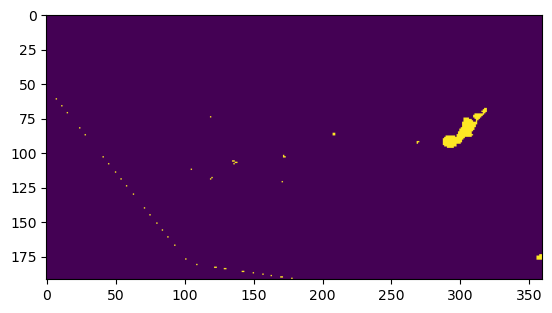

In [57]:
idx = np.nonzero(percentages.reshape(sim_bands.shape[:-1]) > 0.8)
test_im = np.zeros((sim_bands.shape[:-1]))
test_im[idx] = 1
plt.imshow(test_im)

otsu_thresh = np.float32(0.3011271)
sl_mean: 5.055467199556402, 7.926940591011605
t_mean: 3.073034893025195


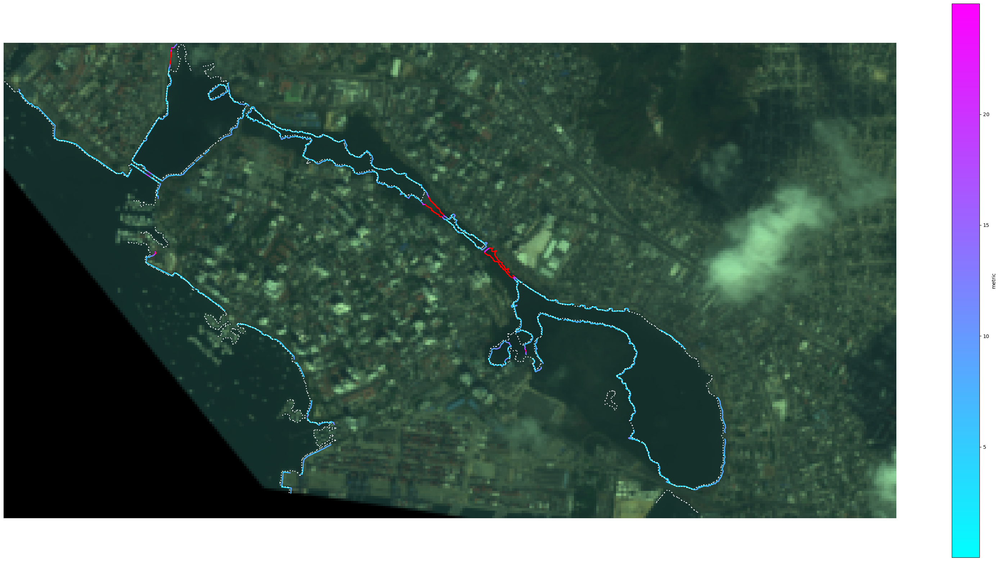

In [81]:
im_ind = ensemble2(sim_bands, ensemble_idx_funcs, otsu, cloud_mask, sl_buffer)
percentages = su.spectral_unmixing_1(sim_bands, im_ind, sds_data)

otsu_thresh = otsu(percentages, cloud_mask, sl_buffer)
contours = wv_eval.get_contours(percentages.reshape(sim_bands.shape[:-1]), otsu_thresh, sds_data)
sl_dists = m.get_nearest_distance(ref_sl_points, contours)
t_dists, _ = m.get_median_distances(transects, ref_sl_points, contours, collider_settings)

print(f"{otsu_thresh = }")
print(f"sl_mean: {np.mean(sl_dists[~outlier_idx])}, {np.mean(sl_dists)}")
print(f"t_mean: {np.nanmean(np.abs(t_dists))}")
contour_pxl = SDS_tools.convert_world2pix(contours, georef)
fig = wvep.plot_shoreline_metric(sl_dists, (0, 25), ref_sl_points_pxl, im_rgb, contours_pxl=contour_pxl)

#### Comparison

thresh = np.float32(0.12913522)


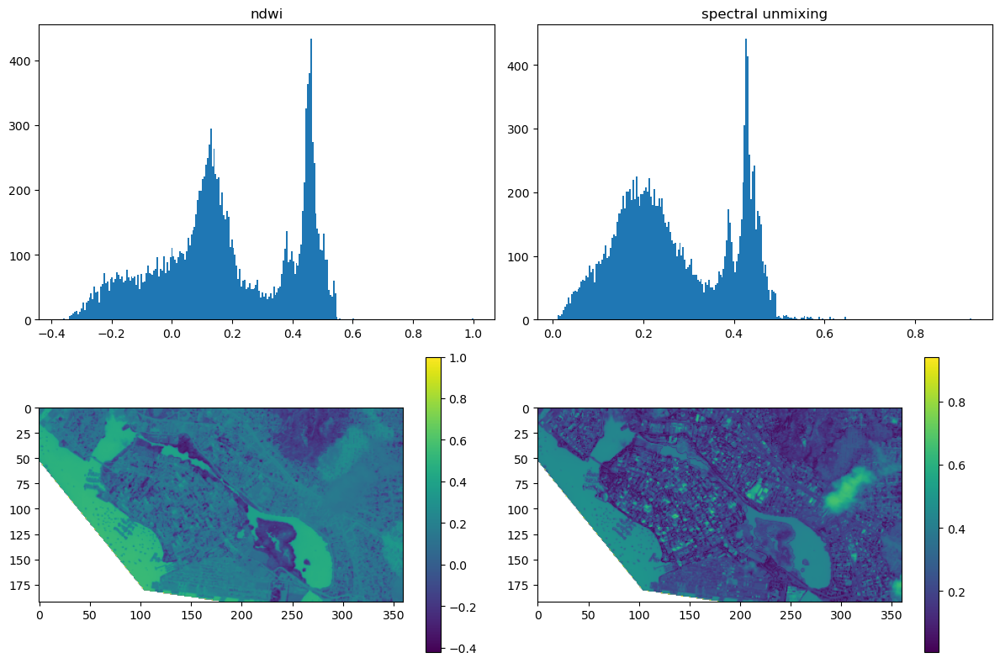

In [16]:
im_ind = ndwi(sim_bands.reshape(-1, sim_bands.shape[-1])).reshape(sim_bands.shape[:-1])
percentages = su.spectral_unmixing_1(sim_bands, im_ind, sds_data)

fig, ax = plt.subplots(2, 2, figsize=(12, 8), tight_layout=True)
ax = ax.ravel()
ax[0].hist(im_ind[sl_buffer].ravel(), bins=256);
ax[0].set_title("ndwi")

ax[1].hist(percentages.reshape(sim_bands.shape[:-1])[sl_buffer].ravel(), bins=256)
ax[1].set_title("spectral unmixing")

cm = ax[2].imshow(im_ind)
fig.colorbar(cm, ax=ax[2])

cm = ax[3].imshow(percentages.reshape(sim_bands.shape[:-1]))
fig.colorbar(cm, ax=ax[3])

otsu_thresh = np.float32(0.29553723)
sl_mean: 10.946955610696158, 19.73383417025797
t_mean: 4.25818076271175


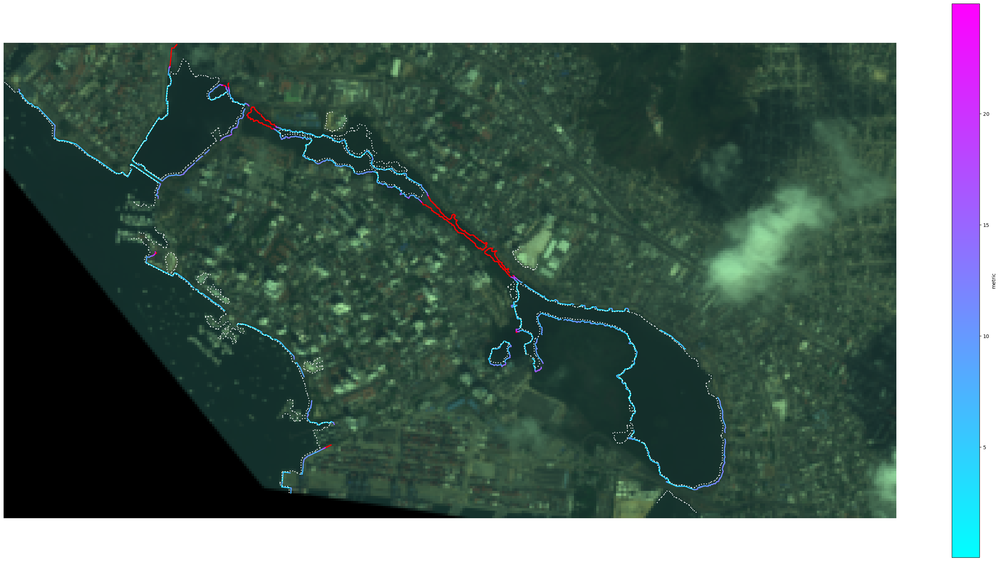

In [17]:


otsu_thresh = otsu(percentages, cloud_mask, sl_buffer)
contours = wv_eval.get_contours(percentages.reshape(sim_bands.shape[:-1]), otsu_thresh, sds_data)
sl_dists = m.get_nearest_distance(ref_sl_points, contours)
t_dists, _ = m.get_median_distances(transects, ref_sl_points, contours, collider_settings)

print(f"{otsu_thresh = }")
print(f"sl_mean: {np.mean(sl_dists[~outlier_idx])}, {np.mean(sl_dists)}")
print(f"t_mean: {np.nanmean(np.abs(t_dists))}")
contour_pxl = SDS_tools.convert_world2pix(contours, georef)
fig = wvep.plot_shoreline_metric(sl_dists, (0, 25), ref_sl_points_pxl, im_rgb, contours_pxl=contour_pxl)

otsu_thresh = np.float64(0.4609375)
sl_mean: 5.023391527266586, 7.844960268994216
t_mean: 3.07304826090213


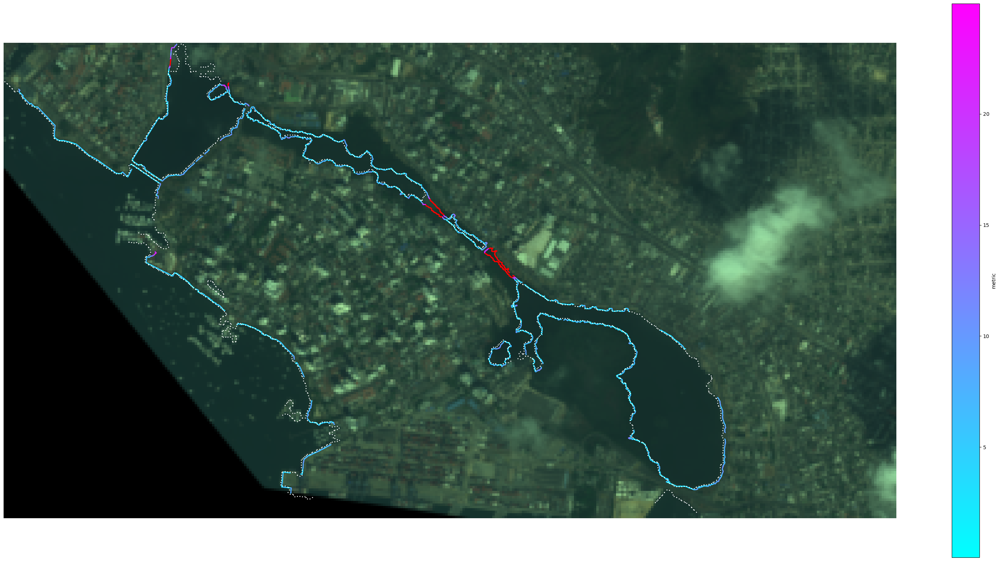

In [23]:
# plain ensemble2 for comparison
im_ind = ensemble2(sim_bands, ensemble_idx_funcs, otsu, cloud_mask, sl_buffer)
otsu_thresh = otsu(im_ind, cloud_mask, sl_buffer)
contours = wv_eval.get_contours(im_ind.reshape(sim_bands.shape[:-1]), otsu_thresh, sds_data)
sl_dists = m.get_nearest_distance(ref_sl_points, contours)
t_dists, _ = m.get_median_distances(transects, ref_sl_points, contours, collider_settings)

print(f"{otsu_thresh = }")
print(f"sl_mean: {np.mean(sl_dists[~outlier_idx])}, {np.mean(sl_dists)}")
print(f"t_mean: {np.nanmean(np.abs(t_dists))}")
contour_pxl = SDS_tools.convert_world2pix(contours, georef)
fig = wvep.plot_shoreline_metric(sl_dists, (0, 25), ref_sl_points_pxl, im_rgb, contours_pxl=contour_pxl)

In [36]:
shoreline_metric, transect_metric, methods, info = wv_eval.evaluate_methods(
    index_functions, threshold_functions, sim_bands, ref_sl_points, transects, collider_settings, sds_data, ensemble_idx_funcs
)
entries, outlier_idx = wv_eval.organize_metrics(shoreline_metric, transect_metric, methods)

shoreline_metric, transect_metric, methods, info = wv_eval.evaluate_methods(
    index_functions, threshold_functions, sim_bands, ref_sl_points, transects, collider_settings, sds_data, ensemble_idx_funcs, spectral_unmixing=True
)
su_entries, _ = wv_eval.organize_metrics(shoreline_metric, transect_metric, methods, outlier_idx)

30it [00:14,  2.08it/s]
30it [00:14,  2.10it/s]


In [43]:
wv_eval.print_metrics(entries, "sl_mean_all")

                                    sl_mean      sl_mean_all  sl_std       sl_outlier     t_mean       t_std        t_mae       
ensemble2__otsu:                    5.023        7.845        2.652        1189           1.019        3.930        3.073       
wi2019__otsu:                       8.237        8.800        7.356        1070           -0.138       6.443        4.869       
mndwi__otsu:                        6.920        9.292        5.497        1490           0.359        5.537        4.326       
mndwi__local_min_otsu:              6.443        9.698        3.838        1506           1.873        4.698        4.227       
ensemble1__otsu:                    5.403        10.191       2.839        1725           0.198        5.625        3.727       
andwi__otsu:                        5.503        10.329       2.959        1740           1.387        3.522        2.941       
ewi__otsu:                          5.464        10.438       3.176        1860           0.605  

In [44]:
wv_eval.print_metrics(su_entries, "sl_mean_all")

                                    sl_mean      sl_mean_all  sl_std       sl_outlier     t_mean       t_std        t_mae       
ensemble2__otsu:                    5.068        6.345        2.785        725            0.528        4.541        3.106       
ddwi__otsu:                         6.993        6.797        8.859        1015           -4.122       6.229        5.027       
ddwi__local_min_otsu:               5.894        8.560        6.390        1536           0.449        4.558        3.063       
scowi__otsu:                        6.906        10.288       5.402        2266           -4.645       8.706        7.476       
nwi__otsu:                          6.008        11.239       3.702        2068           -0.168       5.962        4.315       
ensemble1__otsu:                    6.153        11.427       3.743        2119           0.725        5.224        3.820       
ensemble2__local_min_otsu:          6.809        12.386       3.799        2153           2.579  

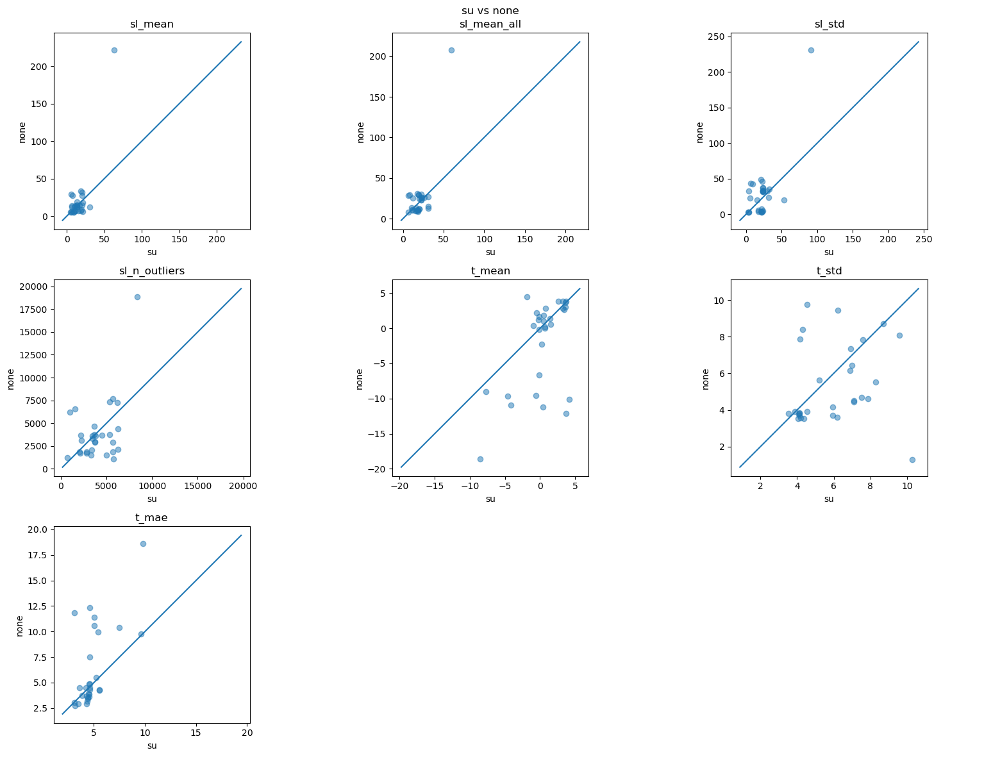

In [45]:
metrics = list(entries[0].keys())[1:]
fig = wvep.plot_comparison(su_entries, entries, "su", "none", metrics)

#### Candidate Signature Exploration

In [61]:
water_pixels = sim_bands[sl_buffer & (im_ind < 0.2)]
np.mean(water_pixels, axis=0)

array([0.17, 0.19, 0.09, 0.08, 0.04, 0.02], dtype=float32)

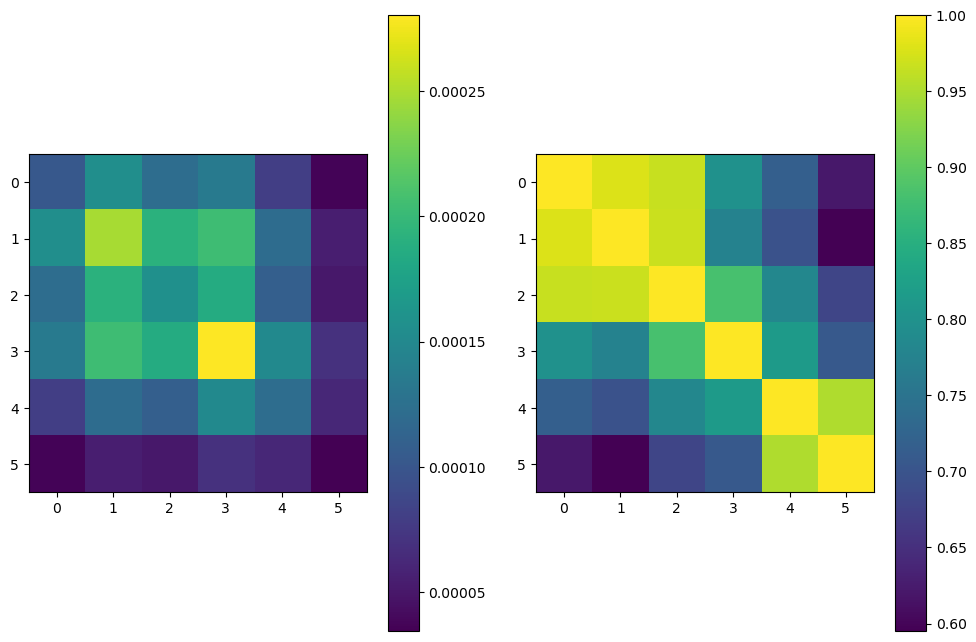

In [1393]:
fig, axs = plt.subplots(1, 2, figsize=(12, 8))
pcm = axs[0].imshow(np.cov(water_pixels.T))
fig.colorbar(pcm, ax=axs[0])

pcm = axs[1].imshow(np.corrcoef(water_pixels.T))
fig.colorbar(pcm, ax=axs[1])

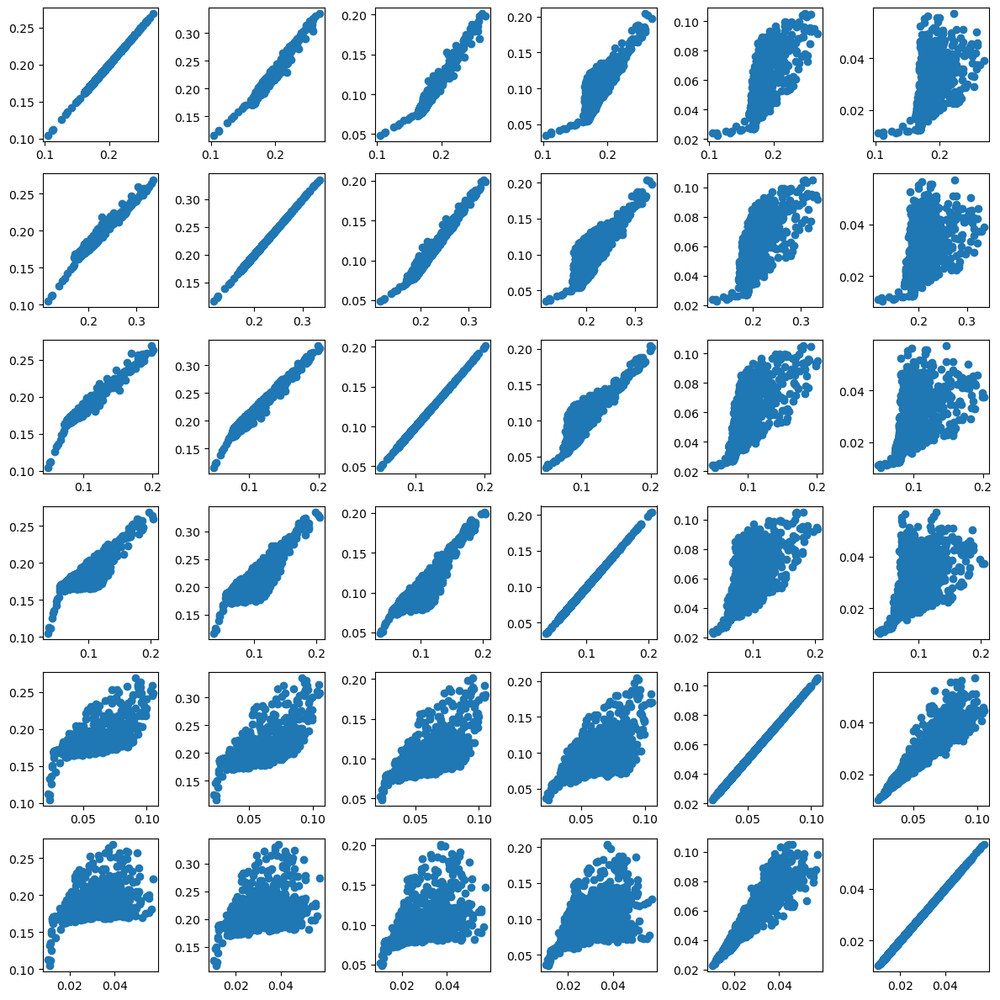

In [1376]:
fig, axs = plt.subplots(sim_bands.shape[-1], sim_bands.shape[-1], figsize=(12, 12), tight_layout=True)
for i in range(sim_bands.shape[-1]):
    for j in range(sim_bands.shape[-1]):
        axs[i,j].scatter(water_pixels[:,i], water_pixels[:,j])

#### Hand Partitioned LSE

Again, improves the "outlier_idx" much more than the easier ones (.1m vs 2m)

Slightly better than ensemble2 - better at narrow area, worse at bridge and pond thing.

In [65]:
def local_sl_extraction_2(masks, thresh_func, sds_data, im_ind=None, percentages=None):
    thresholds = []
    final_contour = []
    assert (im_ind is None) != (percentages is None) # only one of them are filled (for clarity of intention)

    for mask in masks:

        if percentages is None:
            percentages = su.spectral_unmixing_1(sim_bands, im_ind, mask).reshape(192, 360)
        threshold = thresh_func(percentages, sds_data["cloud_mask"], mask)
        thresholds.append(threshold)
        # contours = modified_coastsat.find_wl_contours1(percentages, sds_data["cloud_mask"], mask, threshold)
        # contours = modified_coastsat.find_wl_contours1(im_ind, sds_data["cloud_mask"], mask, threshold)
        contours = modified_coastsat.find_wl_contours1(percentages, sds_data["cloud_mask"], mask, threshold)

        contours = SDS_shoreline.process_shoreline(contours, sds_data["cloud_mask"], sds_data["im_nodata"],
                                        sds_data["georef"], sds_data["image_epsg"], sds_data["sds_settings"])
        contours_pxl = SDS_tools.convert_world2pix(contours, sds_data["georef"])
        if len(contours_pxl) > 0: final_contour.append(contours_pxl)
        
    final_contour_pxl = np.concatenate(final_contour)[:,[1,0]]
    final_contour_world = SDS_tools.convert_pix2world(final_contour_pxl, sds_data["georef"])

    return final_contour_world, thresholds

thresholds = [np.float32(0.30235314), np.float32(0.32776806), np.float32(0.3773168), np.float32(0.3310276), np.float32(0.2659475), np.float32(0.28493202), np.float32(0.36883694)]
sl_mean: 5.034815574711631, 5.9139850657418425
t_mean: 2.9911097490808514


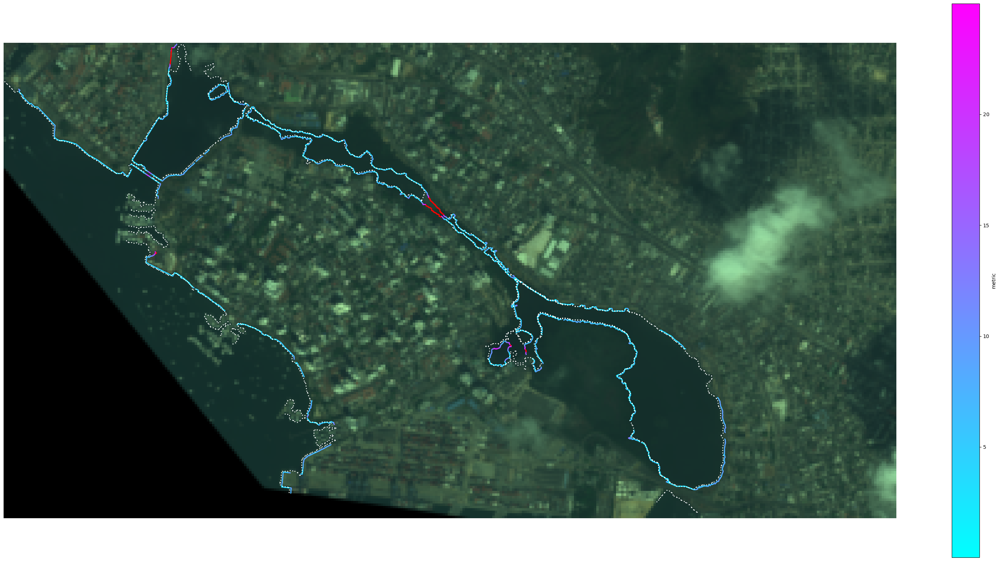

In [70]:
im_ind = ensemble2(sim_bands, ensemble_idx_funcs, otsu, cloud_mask, sl_buffer)
percentages = su.spectral_unmixing_1(sim_bands, im_ind, sl_buffer).reshape(sim_bands.shape[:-1])

contours, thresholds = local_sl_extraction_2(sanity_masks, otsu, sds_data, im_ind=im_ind) # update candidate signature every buffer (and vary threshold)
# contours, thresholds = local_sl_extraction_2(sanity_masks, otsu, sds_data, percentages=percentages) # have one candidate signature for all buffers (only vary threshold)

sl_dists = m.get_nearest_distance(ref_sl_points, contours)
t_dists, _ = m.get_median_distances(transects, ref_sl_points, contours, collider_settings)
contour_pxl = SDS_tools.convert_world2pix(contours, georef)
fig = wvep.plot_shoreline_metric(sl_dists, (0, 25), ref_sl_points_pxl, im_rgb, contours_pxl=contour_pxl)

print(f"{thresholds = }")
print(f"sl_mean: {np.mean(sl_dists[~outlier_idx])}, {np.mean(sl_dists)}")
print(f"t_mean: {np.nanmean(np.abs(t_dists))}")

sl_mean: 4.954974057680281, 7.784989320478408
t_mean: 3.087746512028094


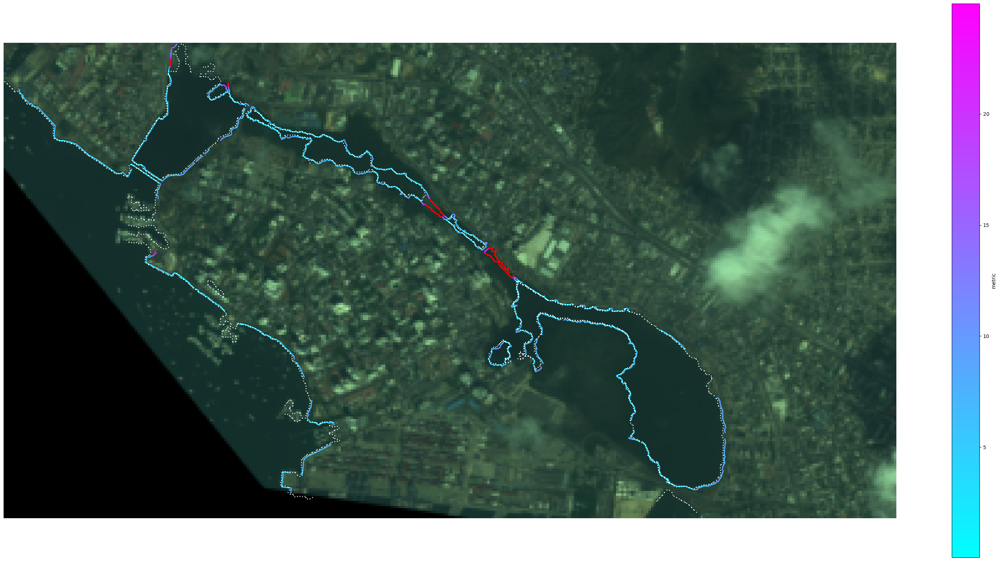

In [71]:
# hand partitioned ensemble2 for comparison
im_ind = ensemble2(sim_bands, ensemble_idx_funcs, otsu, cloud_mask, sl_buffer)
contours, _ = lse.local_sl_extraction_2(sanity_masks, otsu, im_ind, sds_data)
sl_dists = m.get_nearest_distance(ref_sl_points, contours)
t_dists, _ = m.get_median_distances(transects, ref_sl_points, contours, collider_settings)

print(f"sl_mean: {np.mean(sl_dists[~outlier_idx])}, {np.mean(sl_dists)}")
print(f"t_mean: {np.nanmean(np.abs(t_dists))}")
contour_pxl = SDS_tools.convert_world2pix(contours, georef)
fig = wvep.plot_shoreline_metric(sl_dists, (0, 25), ref_sl_points_pxl, im_rgb, contours_pxl=contour_pxl)

#### LSE 1

In [72]:
coords_pxl = SDS_tools.convert_world2pix(ref_sl_points[::100], sds_data["georef"])
im_ind = ensemble2(sim_bands, ensemble_idx_funcs, otsu, cloud_mask, sl_buffer)
percentages = su.spectral_unmixing_1(sim_bands, im_ind, sl_buffer).reshape(sim_bands.shape[:-1])

contours1, _ = lse.local_sl_extraction_1(coords_pxl, percentages, otsu, 10, sds_data, binarize=False, mask_type="shoreline", n_buffer=20)
contours2, _ = lse.local_sl_extraction_1(coords_pxl, percentages, otsu, 50, sds_data, binarize=False, mask_type="square")

sl_dists1 = m.get_nearest_distance(ref_sl_points, contours1)
t_dists1, _ = m.get_median_distances(transects, ref_sl_points, contours1, collider_settings)
sl_dists2 = m.get_nearest_distance(ref_sl_points, contours2)
t_dists2, _ = m.get_median_distances(transects, ref_sl_points, contours2, collider_settings)


print(f"sl_mean1: {np.mean(sl_dists1[~outlier_idx])}, {np.mean(sl_dists1)}")
print(f"t_mean1: {np.nanmean(np.abs(t_dists1))}")
print(f"sl_mean2: {np.mean(sl_dists2[~outlier_idx])}, {np.mean(sl_dists2)}")
print(f"t_mean2: {np.nanmean(np.abs(t_dists2))}")

sl_mean1: 5.470815619254409, 6.63796178060149
t_mean1: 2.9162337876732223
sl_mean2: 5.090345351229865, 6.251140636085574
t_mean2: 3.0092812622447553


### LSE 1 Masking Methodology

**Square** looks in a square around center point. Issue: sometimes picks up part of buffer from a different part of the shoreline.

**Along SL** goes along shoreline in either directioe. Issue: requires reference shoreline to be segmented (so buffer doesn't randomly jump around) and when two shorelines are close together, it is likely more relevant to look at buffer associated with other shoreline, as opposed to continuing along the shoreline, further from the center point (**Square** does not have this issue)

**Nearby** takes nearest k points to build buffer. Potentially less likely to pick up buffer from different part of shoreline (how much less likely? Does this justify the added complexity over **Square**? I don't think so). 

In [41]:
coords_kdtree = KDTree(coords_pxl)

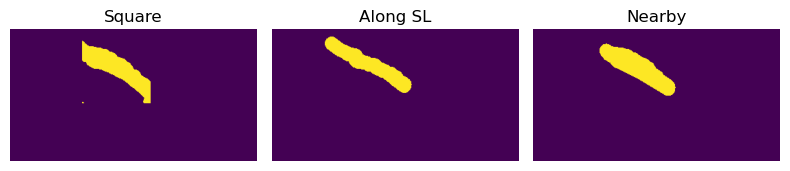

In [52]:
px_idx = 100
buffer_size = 50
buffer_radius = 10
n_buffer = 20

mask1 = lse.get_mask(coords_pxl[px_idx], buffer_size, im_ind.shape, sds_data["sl_buffer"])
mask2 = lse.get_mask_along_shoreline(coords_pxl, px_idx, buffer_radius, n_buffer, im_ind.shape)
mask3 = lse.get_nearby_mask(coords_pxl, px_idx, coords_kdtree, 60, im_ind.shape, buffer_radius)

fig, ax = plt.subplots(1, 3, figsize=(8, 12), tight_layout=True)
ax[0].imshow(mask1)
ax[0].set_title("Square")
ax[1].imshow(mask2)
ax[1].set_title("Along SL")
ax[2].imshow(mask3)
ax[2].set_title("Nearby")

for x in ax:
    x.axis(False)

### Comparing LSE Methods

Seems like basically noise, except for notable improvements on difficult areas (visible in improved sl_mean_all, sl_std, and n_outliers).

This is some more shaky evidence that WI are not proficient at representing sub-pixel water contents

WI2015 has some odd behaviour, maybe worth investigating, but for this location the index seems pretty garbage so why bother

Also unclear if LSE1 or LSE2 is better

In [138]:
coords_pxl = ref_sl_points_pxl[::100]
zone_indicators = np.zeros((len(coords_pxl)), dtype=int)
zone_indicators[:81] = 0
zone_indicators[81:105] = 1
zone_indicators[105:120] = 2
zone_indicators[120:142] = 1
zone_indicators[142:147] = 2
zone_indicators[147:164] = 3
zone_indicators[164:190] = 4
zone_indicators[190:217] = 5
zone_indicators[217:222] = 2
zone_indicators[222:] = 6

In [212]:
shoreline_metric, transect_metric, methods, info = wv_eval.evaluate_methods(
    index_functions, threshold_functions, sim_bands, ref_sl_points, transects, collider_settings, sds_data, ensemble_idx_funcs
)

lse1_shoreline_metric, lse1_transect_metric, methods, info = wv_eval.evaluate_methods(
    index_functions, threshold_functions, sim_bands, ref_sl_points, transects, collider_settings, sds_data, ensemble_idx_funcs, lse1=True
)

lse2_shoreline_metric, lse2_transect_metric, methods, info = wv_eval.evaluate_methods(
    index_functions, threshold_functions, sim_bands, ref_sl_points, transects, collider_settings, sds_data, ensemble_idx_funcs, lse2=True
)

lse_sanity_shoreline_metric, lse_sanity_transect_metric, methods, info = wv_eval.evaluate_methods(
    index_functions, threshold_functions, sim_bands, ref_sl_points, transects, collider_settings, sds_data, ensemble_idx_funcs, lse2=True, zones=zone_indicators
)

30it [00:17,  1.75it/s]
30it [00:44,  1.47s/it]
30it [00:16,  1.81it/s]
30it [00:14,  2.07it/s]


In [213]:
entries, outlier_idx = wv_eval.organize_metrics(shoreline_metric, transect_metric, methods)
lse1_entries, _ = wv_eval.organize_metrics(lse1_shoreline_metric, lse1_transect_metric, methods, outlier_idx)
lse2_entries, _ = wv_eval.organize_metrics(lse2_shoreline_metric, lse2_transect_metric, methods, outlier_idx)
lse_sanity_entries, _ = wv_eval.organize_metrics(lse_sanity_shoreline_metric, lse_sanity_transect_metric, methods, outlier_idx)

In [214]:
sort_var = "sl_mean"

wv_eval.print_metrics(entries, sort_var)
print('\n')
wv_eval.print_metrics(lse1_entries, sort_var)
print('\n')
wv_eval.print_metrics(lse2_entries, sort_var)
print('\n')
wv_eval.print_metrics(lse_sanity_entries, sort_var)

                                    sl_mean      sl_mean_all  sl_std       sl_outlier     t_mean       t_std        t_mae       
ensemble2__otsu:                    5.023        7.845        12.237       1189           1.019        3.930        3.073       
ensemble1__otsu:                    5.403        10.191       17.388       1725           0.198        5.625        3.727       
ewi__otsu:                          5.464        10.438       17.891       1860           0.605        3.906        2.727       
andwi__otsu:                        5.503        10.329       17.455       1740           1.387        3.522        2.941       
nwi__otsu:                          5.816        10.848       17.913       1834           1.691        3.697        3.176       
tct_wetness__local_min_otsu:        6.401        11.840       18.872       2149           2.207        4.518        3.943       
mndwi__local_min_otsu:              6.443        9.698        13.416       1506           1.873  

['sl_mean', 'sl_mean_all', 'sl_std', 'sl_n_outliers', 't_mean', 't_std', 't_mae']


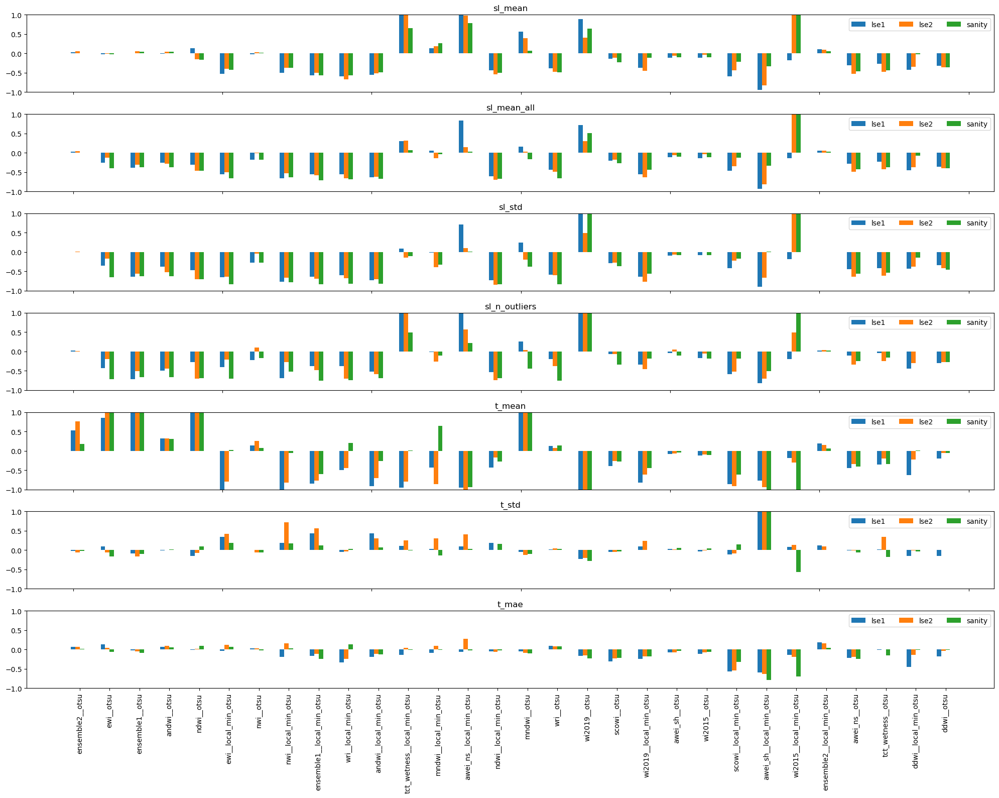

In [217]:
def plot_comparison_barplot(entries_arr, titles):
    methods = [e["method"] for e in entries_arr[0]]
    metrics = list(entries_arr[0][0].keys())[1:]
    # metrics = list(entries_arr[0][0].keys())[:]
    print(metrics)

    fig, ax = plt.subplots(len(metrics), 1, figsize=(20, 16), tight_layout=True)

    for i, metric in enumerate(metrics):
    
        x = np.arange(len(methods))  # the label locations
        width = 0.15  # the width of the bars
        multiplier = 0

        metric_matrix = np.array([[e[metric] for e in entries_arr[i]] for i in range(len(titles))])

        if i == 0:
            # sort in increasing order (of actual metric value)
            min_metric = np.min(metric_matrix, axis=0)
            min_idx = np.argsort(min_metric)
            methods = [methods[i] for i in min_idx]
        metric_matrix = metric_matrix[:,min_idx]

        # assume first in entries_arr is the reference
        relative_change = np.array([(metric_matrix[i,:] - metric_matrix[0,:]) / metric_matrix[0,:] for i in range(1, len(metric_matrix))])
        metric_dict = {titles[i+1] : relative_change[i,:] for i in range(len(relative_change))}

        for attribute, measurement in metric_dict.items():
            offset = width * multiplier
            rects = ax[i].bar(x + offset, measurement, width, label=attribute)
            # ax[i].bar_label(rects, padding=3)
            multiplier += 1


        ax[i].set_title(metric)
        ax[i].legend(loc='upper right', ncols=3)
        ax[i].set_ylim(-1, 1)
        ax[i].tick_params(
            axis='x',          # changes apply to the x-axis
            labelbottom=False)
        ax[-1].set_xticks(x + .5 * (len(titles) - 1) * width)
    
    ax[-1].tick_params(
            axis='x',          # changes apply to the x-axis
            labelbottom=True)
    ax[-1].set_xticks(x + .5 * (len(titles) - 1) * width, methods, rotation='vertical')

entries_arr = [entries, lse1_entries, lse2_entries, lse_sanity_entries]
titles = ["none", "lse1", "lse2", "sanity"]
plot_comparison_barplot(entries_arr, titles)

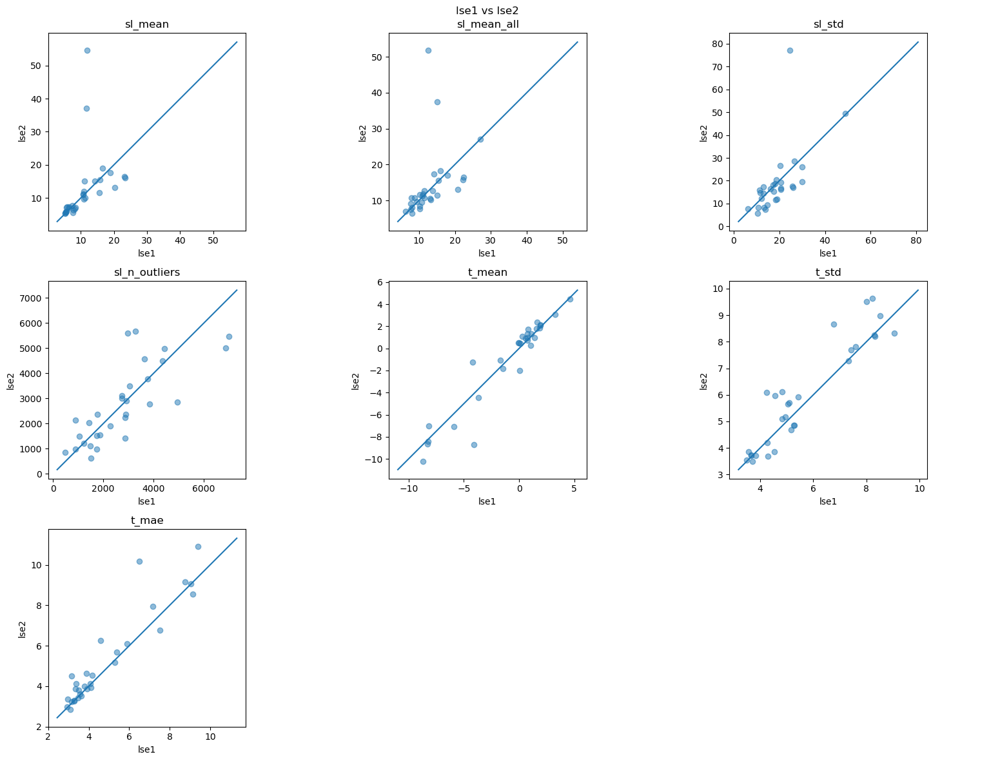

In [218]:
metrics = list(entries[0].keys())[1:]
fig = wvep.plot_comparison(lse1_entries, lse2_entries, "lse1", "lse2", metrics, sl_lim=100)

## Better Degradation

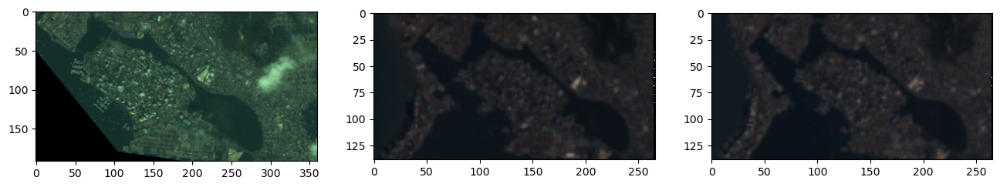

In [3]:
# l8_path = r"C:\Users\avanever\Documents\CoastSatProject\Experiments\data\colombia\L8\ms\2020-01-09-15-17-31_L8_009053_colombia_ms.tif"
l8_path = r"C:\Users\avanever\Documents\ColombiaData\L8\ms\2020-01-09-15-17-31_L8_009053_colombia_ms.tif"
l8_bands = wv.load_sim_tif(l8_path)

# l9_path = r"C:\Users\avanever\Documents\CoastSatProject\Experiments\data\colombia\L9\ms\2021-12-28-15-23-48_L9_010053_colombia_ms.tif"
l9_path = r"C:\Users\avanever\Documents\ColombiaData\L9\ms\2021-12-28-15-23-48_L9_010053_colombia_ms.tif"
l9_bands = wv.load_sim_tif(l9_path)

fig, ax  = plt.subplots(1, 3, figsize=(16, 8))
ax[0].imshow(im_rgb)
ax[1].imshow(l9_bands[:,:,[2, 1, 0]])
ax[2].imshow(l8_bands[:,:,[2, 1, 0]])

In [159]:
l8 = gdal.Open(l8_path)
l9 = gdal.Open(l9_path)
gt8 = l8.GetGeoTransform()
gt9 = l9.GetGeoTransform()
l8, l9 = None, None

print(gt8)
print(gt9)

(439102.5, 15.0, 0.0, 1152307.5, 0.0, -15.0)
(439102.5, 15.0, 0.0, 1152307.5, 0.0, -15.0)


### SNR/Noise Estimation

#### From Unifrom Patch of Water

Values too low, esp for NIR and SWIR

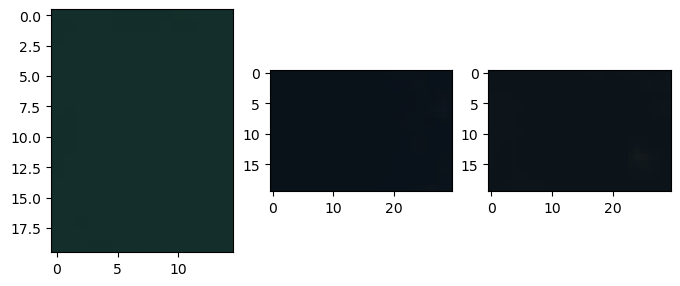

In [265]:
def est_snr_from_unif_aoi(aoi):
    signal = aoi.mean(axis=(0,1))
    noise = aoi.std(axis=(0,1))

    with np.printoptions(precision=5):
        print(signal)
        print(noise)
    return signal / noise


sim_unif_aoi = sim_bands[55:75,30:45,:] # 10m
# sim_unif_aoi = sim_bands[27:40,15:20,:] # for 20m resolution
l8_unif_aoi = l8_bands[100:120,70:100,:]
l9_unif_aoi = l9_bands[100:120,70:100,:]

fig, ax = plt.subplots(1, 3, figsize=(8, 12))
ax[0].imshow(sim_unif_aoi[:,:,[2, 1, 0]])
ax[1].imshow(l8_unif_aoi[:,:,[2, 1, 0]])
ax[2].imshow(l9_unif_aoi[:,:,[2, 1, 0]])

In [53]:
snr = est_snr_from_unif_aoi(sim_unif_aoi)
snr

[0.16938 0.18336 0.07876 0.0628  0.03164 0.01649]
[0.00053 0.00102 0.00067 0.00078 0.00093 0.00054]


array([317.64, 179.79, 116.8 ,  80.84,  34.18,  30.55], dtype=float32)

In [54]:
snr = est_snr_from_unif_aoi(l8_unif_aoi)
snr

[0.10185 0.06945 0.03807 0.01802 0.00721 0.00467]
[0.00191 0.00248 0.00223 0.00239 0.00226 0.00112]


array([53.41, 28.03, 17.07,  7.55,  3.19,  4.16], dtype=float32)

In [55]:
snr = est_snr_from_unif_aoi(l9_unif_aoi)
snr

[0.10168 0.08109 0.05137 0.01926 0.00772 0.00476]
[0.00156 0.002   0.00244 0.00334 0.003   0.00154]


array([64.97, 40.64, 21.06,  5.76,  2.57,  3.1 ], dtype=float32)

#### Water in Buffer

In [11]:
im_ind = ensemble2(sim_bands, ensemble_idx_funcs, otsu, cloud_mask, sl_buffer)
water_pixels = sim_bands[sl_buffer & (im_ind <= 0.1)]
print(water_pixels.shape)
signal = water_pixels.mean(axis=0)
noise = water_pixels.std(axis=0)
print(signal)
print(noise)
print(signal / noise)

(5087, 6)
[0.17 0.19 0.09 0.07 0.04 0.02]
[0.01 0.01 0.01 0.01 0.01 0.  ]
[24.16 16.55  9.58  5.99  4.72  4.31]


#### Difference Estimator (lag=1)

In [12]:
for i in range(sim_bands.shape[-1]):
    patch = sim_bands[100:150, 100:150, i].astype(float)
    diff_h = patch[:, 1:] - patch[:, :-1]
    diff_v = patch[1:, :] - patch[:-1, :]
    noise_var = (diff_h.var() + diff_v.var()) / 4  # /2 for diff, average h+v
    signal = patch.mean()
    print(f'Band {i}: lag-1 SNR = {signal / np.sqrt(noise_var):.1f}')

Band 0: lag-1 SNR = 7.6
Band 1: lag-1 SNR = 5.9
Band 2: lag-1 SNR = 4.5
Band 3: lag-1 SNR = 5.3
Band 4: lag-1 SNR = 5.3
Band 5: lag-1 SNR = 4.6


#### Variogram

Raw Landsat has higher SNR than degraded WV3 (this doesn't make sense)

Results seem very sensitive to hyperparameter selection... which selection is "correct"?

Assumptions listed in original paper get violated easily (ROI has to have single land cover type, and check random features don't increase nugget variances, and only look at column/row transects)

In [52]:
def semivariogram_snr(bands, estimator='cressie', n_lags=20, maxlag=10, model='spherical'):
    coords = np.stack(np.meshgrid(np.arange(bands.shape[0]), np.arange(bands.shape[1])), axis=2).reshape(-1, 2)

    snr = []
    for i in range(bands.shape[-1]):
        values = bands[:,:,i].flatten()
        # print(values)
        valid_idx = ~np.isnan(values) & ~np.isinf(values)
        V = skgstat.Variogram(coords[valid_idx], values[valid_idx], estimator=estimator, n_lags=n_lags, maxlag=maxlag, model=model, use_nugget=True)
        snr.append(np.mean(values[valid_idx]) / np.sqrt(V.parameters[2]))
        # print(np.mean(values[valid_idx]), np.sqrt(V.parameters[2]))

    return np.array(snr)

In [ ]:
models = ["spherical", "exponential", "gaussian", "cubic"]

for model in models:
    print(semivariogram_snr(sim_bands[55:75,30:45,:], n_lags=5, maxlag=5, model=model))

[434.9  227.7  140.55 107.41  53.53  49.83]
[434.9  227.7  140.55 107.41  53.53  49.83]
[434.9  227.7  140.55 107.41  53.53  49.83]
[434.9  227.7  140.55 107.41  53.53  49.83]


In [14]:
aois = [
    sim_bands[55:75,30:45], sim_bands[55:70,30:45], sim_bands[55:75,30:40], sim_bands[60:75,30:45], sim_bands[55:75,35:45],
    sim_bands[60:75,30:40], sim_bands[60:75,35:45]
]

for aoi in aois:
    print(semivariogram_snr(aoi, n_lags=5, maxlag=5, model="spherical"))

[434.9  227.7  140.55 107.41  53.53  49.83]
[686.55 285.51 185.92 204.42  63.27  61.36]
[486.35 244.7  161.03 100.43  46.41  38.69]
[652.9  329.28 188.59 160.72  96.22  67.89]
[478.17 239.43 144.41 171.9   45.87  39.94]
[415.9  214.97 123.9   91.5   77.12  48.73]
[594.42 333.2  190.94 190.    76.23  58.36]


In [16]:
sim_bands[55:75,30:45,:]

for i in range(55, 75):
    print(semivariogram_snr(sim_bands[[i],30:45], n_lags=5, maxlag=5, model="spherical"))

[658.69 399.84 192.1  117.53  60.28 127.27]
[780.86 432.78 430.25 223.14  76.52 221.01]
[2182.74  712.37  197.33  322.46   73.33  122.02]
[1176.33  265.1   256.86  265.3    94.53  151.6 ]
[769.46 243.05 129.72  98.77 175.97 109.27]
[863.28 831.17 742.12 184.42 269.99 111.94]
[1176.78 2364.39  277.23  177.57  149.81   99.15]
[1699.96  581.19  197.71  321.8   146.56   80.25]
[690.71 342.74 290.11 162.74 161.27  72.42]
[760.5  205.74 191.7  161.1  160.99 100.05]
[379.7  202.93 100.32  97.34 129.83 110.4 ]
[495.98 230.52 122.36  97.24  93.93  72.69]
[908.9  276.65 120.37 140.44  78.27  54.13]
[770.79 272.06 145.16 155.02  85.39 106.74]
[1031.3   268.65  211.73  239.8    95.43   95.54]
[302.81 233.68 174.05 156.69  66.86  84.5 ]
[361.34 292.32 126.58 111.66  79.11  87.19]
[379.7  266.89 145.22 117.37  91.43 105.22]
[690.84 343.47 172.08 135.98 149.32 116.92]
[542.61 535.25 168.67 210.14 117.91  93.48]


In [21]:
estimators = ["matheron", "cressie", "dowd"]

for e in estimators:
    print(semivariogram_snr(sim_bands[55:75,30:45,:], estimator=e))

[295.25 166.73 107.    78.67  31.73  29.22]
[350.29 177.32 118.79  81.72  29.99  24.16]
[332.63 180.02 103.11  61.65  31.07  21.58]


#### Directional Semivariogram

In [68]:
def directional_semivariogram_snr(bands, dir=None, estimator='cressie', n_lags=20, maxlag=10, model='gaussian'):
    x, y = np.meshgrid(np.arange(bands.shape[0]), np.arange(bands.shape[1]))
    if dir == "row": y *= 1000
    if dir == "col": x *= 1000
    coords = np.stack([x, y], axis=2).reshape(-1, 2)

    signal = []
    noise_std = []
    for i in range(bands.shape[-1]):
        values = bands[:,:,i].flatten()
        valid_idx = ~np.isnan(values) & ~np.isinf(values)
        V = skgstat.Variogram(coords[valid_idx], values[valid_idx], estimator=estimator, n_lags=n_lags, maxlag=maxlag, model=model, use_nugget=True)
        # print(np.mean(values[valid_idx]),  np.sqrt(V.parameters[2]))
        # snr.append(np.mean(values[valid_idx]) / np.sqrt(V.parameters[2]))
        signal.append(np.mean(values[valid_idx]))
        noise_std.append(np.sqrt(V.parameters[2]))

    signal = np.array(signal)
    noise_std = np.array(noise_std)
    return signal / noise_std, signal, noise_std

In [69]:
print(directional_semivariogram_snr(sim_bands[55:75,30:45,:], dir="row"))
print(directional_semivariogram_snr(sim_bands[55:75,30:45,:], dir="col"))
# print(directional_semivariogram_snr(sim_bands[55:75,30:45,:]))

(array([368.38, 229.37, 129.17,  80.56,  55.8 ,  73.63]), array([0.17, 0.18, 0.08, 0.06, 0.03, 0.02], dtype=float32), array([0., 0., 0., 0., 0., 0.]))
(array([289.31, 143.95, 103.97,  70.44,  23.83,  17.09]), array([0.17, 0.18, 0.08, 0.06, 0.03, 0.02], dtype=float32), array([0., 0., 0., 0., 0., 0.]))


In [228]:
print(directional_semivariogram_snr(l8_bands[100:120,70:85,:], dir="row"))
print(directional_semivariogram_snr(l8_bands[100:120,70:85,:], dir="col"))
# print(directional_semivariogram_snr(l8_bands[100:120,70:85,:]))

(array([377.42, 164.86, 181.76,  68.15,  19.25,  23.35]), array([0.1 , 0.07, 0.04, 0.02, 0.01, 0.  ], dtype=float32), array([0., 0., 0., 0., 0., 0.]))
(array([236.21,  84.91, 114.72,  33.99,   9.66,   8.04]), array([0.1 , 0.07, 0.04, 0.02, 0.01, 0.  ], dtype=float32), array([0., 0., 0., 0., 0., 0.]))


In [229]:
print(directional_semivariogram_snr(l9_bands[100:120,70:85,:], dir="row"))
print(directional_semivariogram_snr(l9_bands[100:120,70:85,:], dir="col"))
# print(directional_semivariogram_snr(l9_bands[100:120,70:85,:]))

(array([211.19, 110.93,  61.27,  56.92,  20.45,  18.  ]), array([0.1 , 0.08, 0.05, 0.02, 0.01, 0.  ], dtype=float32), array([0., 0., 0., 0., 0., 0.]))
(array([218.99, 100.15,  55.16,  24.79,   6.57,   5.75]), array([0.1 , 0.08, 0.05, 0.02, 0.01, 0.  ], dtype=float32), array([0., 0., 0., 0., 0., 0.]))


### Band Comparison

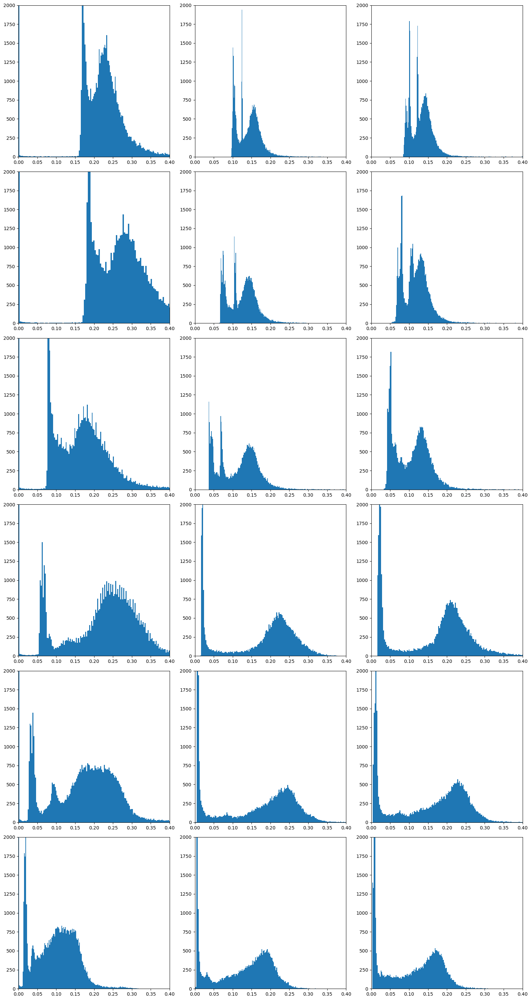

In [35]:
def get_valid_mask(bands, band_idx):
    return ~np.isnan(bands[:,:,band_idx]) & ~np.isinf(bands[:,:,band_idx])

def plot_band_comparison(bands_arr, n_bands):
    fig, ax = plt.subplots(n_bands, 3, figsize=(16, 5 * n_bands), tight_layout=True)

    for i in range(n_bands):
        for j, bands in enumerate(bands_arr):
            valid_mask = get_valid_mask(bands, i)
            ax[i,j].hist(bands[valid_mask, i].ravel(), bins=256)
            ax[i,j].set_xlim(0, 0.4)
            ax[i,j].set_ylim(0, 2000)


bands_arr = [sim_bands, l8_bands, l9_bands]
plot_band_comparison(bands_arr, sim_bands.shape[-1])

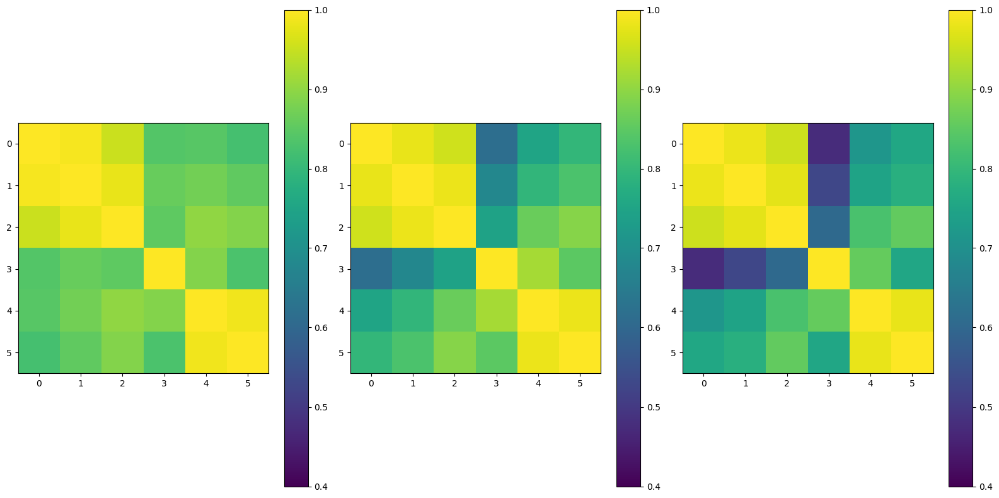

In [28]:
fig, ax = plt.subplots(1, 3, figsize=(16, 8), tight_layout=True)
cmap = cm.get_cmap('viridis')

for i, bands in enumerate(bands_arr):
    valid_mask = get_valid_mask(bands, 0)
    bands_for_corr = bands[valid_mask,:].reshape(-1, bands.shape[-1]).T
    p = ax[i].imshow(np.corrcoef(bands_for_corr), cmap=cmap, vmin=0.4, vmax=1)
    fig.colorbar(p, ax=ax[i])

### Match Noise

In [ ]:
def match_noise_std(source_bands, source_std, target_std):
    valid_idx = target_std - source_std > 0
    add_std = np.zeros(source_bands.shape[-1])
    add_std[valid_idx] = np.sqrt(target_std[valid_idx] ** 2 - source_std[valid_idx] ** 2)
    noise = np.random.randn(*source_bands.shape) * add_std

    # print(f"source bands {np.nonzero(~valid_idx)} had greater noise std than target (and were therefore unchanged)")
    return np.clip(source_bands + noise, 0, 1)

# add noise to each pixel (and band) considering that pixel's amplitude
def match_snr(source_bands, source_snr, target_snr):

    # calculate noise sd from amplitudes and snr
    source_std = source_bands / source_snr
    target_std = source_bands / target_snr

    # calculate noise for bands where source_snr > target_snr
    valid_idx = source_snr - target_snr > 0
    add_std = np.zeros(source_bands.shape)
    add_std[:,:,valid_idx] = np.sqrt(target_std[:,:,valid_idx] ** 2 - source_std[:,:,valid_idx] ** 2)

    # return noise
    noise = np.random.randn(*source_bands.shape) * add_std
    return np.clip(source_bands + noise, 0, 1)

In [202]:
sim_snr, sim_signal, sim_noise = directional_semivariogram_snr(sim_bands[55:75,30:45,:], dir="row")
l8_snr, l8_signal, l8_noise = directional_semivariogram_snr(l8_bands[100:120,70:85,:], dir="row")
l9_snr, l9_signal, l9_noise = directional_semivariogram_snr(l9_bands[100:120,70:85,:], dir="row")

In [227]:
sim_bands_noise = match_snr(sim_bands, sim_snr, l9_snr)
noise_sim_snr, noise_sim_signal, noise_sim_noise = directional_semivariogram_snr(sim_bands_noise[55:75,30:45,:], dir="row")

with np.printoptions(precision=5):
    print(sim_noise, sim_snr)
    print(l9_noise, l9_snr)
    print(noise_sim_noise, noise_sim_snr)

[0.00046 0.0008  0.00061 0.00078 0.00057 0.00022] [368.37903 229.36748 129.17063  80.56153  55.80345  73.63494]
[0.00048 0.00073 0.00084 0.00032 0.00033 0.00024] [211.18591 110.93044  61.26907  56.92253  20.44948  17.99981]
[0.00097 0.00175 0.00151 0.00114 0.00159 0.00099] [175.45183 104.69818  52.1095   54.9807   19.98729  16.69604]


In [226]:
sim_bands_noise = match_noise_std(sim_bands, sim_noise, l9_noise)
noise_sim_snr, noise_sim_signal, noise_sim_noise = directional_semivariogram_snr(sim_bands_noise[55:75,30:45,:], dir="row")

with np.printoptions(precision=5):
    print(sim_noise, sim_snr)
    print(l9_noise, l9_snr)
    print(noise_sim_noise, noise_sim_snr)

[0.00046 0.0008  0.00061 0.00078 0.00057 0.00022] [368.37903 229.36748 129.17063  80.56153  55.80345  73.63494]
[0.00048 0.00073 0.00084 0.00032 0.00033 0.00024] [211.18591 110.93044  61.26907  56.92253  20.44948  17.99981]
[0.00056 0.0008  0.00089 0.00078 0.00057 0.00026] [300.74412 229.36747  88.41274  80.56153  55.80345  64.35862]


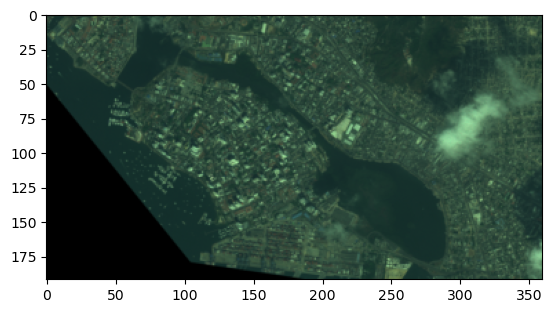

In [207]:
plt.imshow(sim_bands_noise[:,:,[2, 1, 0]])

### Colour Matching

#### Applying to WV3

In [9]:
n_bands = sim_bands.shape[-1]

source = sim_bands.reshape(-1, n_bands)
invalid_mask = np.isinf(source) | np.isnan(source)
source = source[~invalid_mask].reshape(-1, n_bands)

target = l9_bands.reshape(-1, n_bands)
invalid_mask = np.isinf(target) | np.isnan(target)
target = target[~invalid_mask].reshape(-1, n_bands)

def make_batches(arr, n_batches=5):
    arr = arr[:(len(arr) // n_batches) * n_batches] # truncate to even batch size
    shuffle_idx = np.arange(len(arr))
    np.random.shuffle(shuffle_idx)
    arr = arr[shuffle_idx]
    return np.array(np.split(arr, n_batches)), shuffle_idx

source_batches, source_shuffle_idx = make_batches(source)
target_batches, target_shuffle_idx = make_batches(target)

print(source.shape, target.shape)
print(source_batches.shape, target_batches.shape)

(69120, 6) (36835, 6)
(5, 13824, 6) (5, 7367, 6)


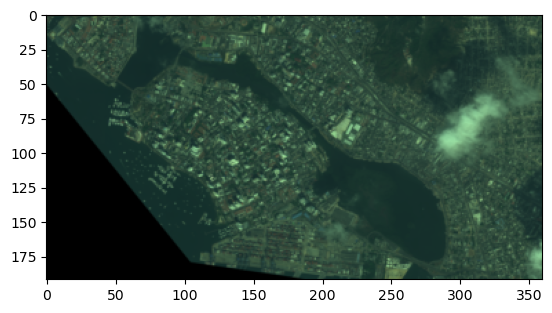

In [10]:
def recover_image_from_batches(batches, shuffle_idx, imshape):
    recovered = np.concatenate(batches)

    unshuffle_idx = np.zeros(recovered.shape[0], dtype=int)
    unshuffle_idx[shuffle_idx] = np.arange(recovered.shape[0])
    return recovered[unshuffle_idx].reshape(imshape)

recovered = recover_image_from_batches(source_batches, source_shuffle_idx, sim_bands.shape)
plt.imshow(recovered[:,:,[2,1,0]])

In [13]:
dist_matrix = ot.batch.dist_batch(source_batches, target_batches)
dist_matrix.shape

(5, 13824, 7367)

In [ ]:
result = ot.batch.solve_batch(dist_matrix, 0.1)

In [11]:
def transport_batches(plan, target_batches, n_batches=5):
    transported_batches = []

    for batch_idx in range(n_batches):
        row_sums = plan[batch_idx].sum(axis=1, keepdims=True)
        normalized_plan = np.divide(plan[batch_idx], row_sums, where=row_sums > 0)

        # Project source points into the target space configuration
        transported_batches.append(np.dot(normalized_plan, target_batches[batch_idx]))

    return transported_batches

In [ ]:
transported_batches = transport_batches(result.plan, target_batches)
im = recover_image_from_batches(transported_batches, source_shuffle_idx, sim_bands.shape)

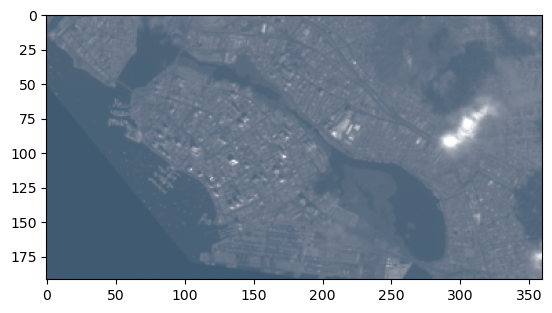

In [29]:
plt.imshow(SDS_preprocess.rescale_image_intensity(im[:,:,[2,1,0]], cloud_mask, 99.9), interpolation=None)

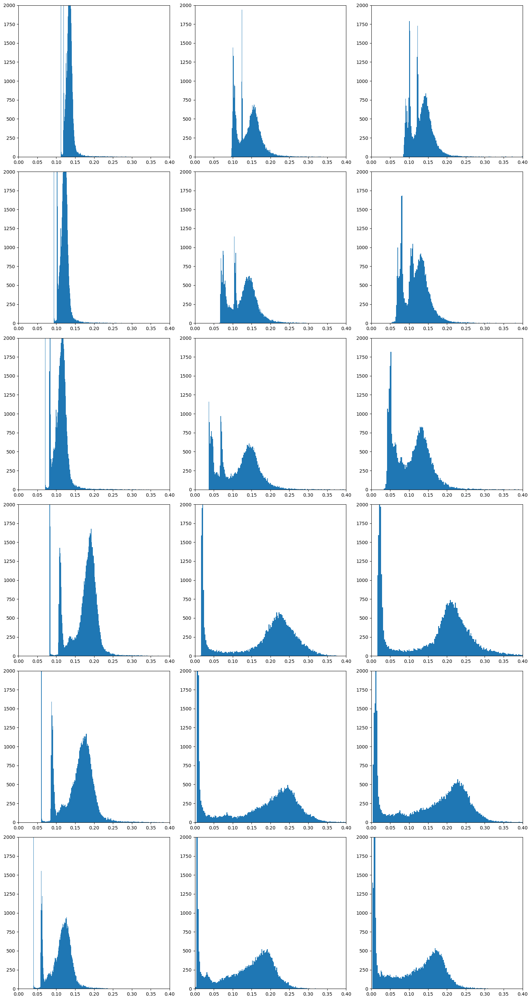

In [36]:
bands_arr = [im, l8_bands, l9_bands]
plot_band_comparison(bands_arr, sim_bands.shape[-1])

#### Testing POT

(75, 75, 3) (75, 75, 3)


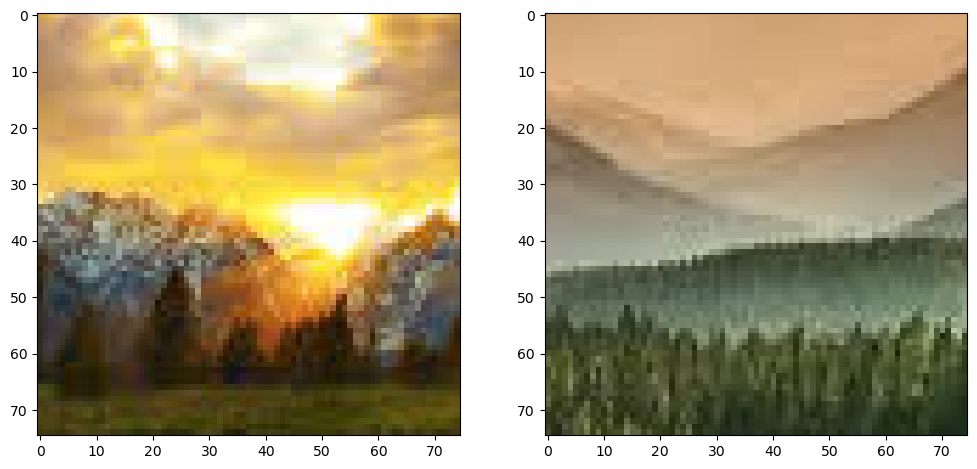

In [13]:
im1_path = r"C:\Users\avanever\Documents\Test_Images\colourful_im.jpg"
im2_path = r"C:\Users\avanever\Documents\Test_Images\less_colourful_im.jpg"

im1 = np.array(Image.open(im1_path).convert('RGB'))[50:125,75:150]
im2 = np.array(Image.open(im2_path).convert('RGB'))[100:175,75:150]
print(im1.shape, im2.shape)

fig, axs = plt.subplots(1, 2, figsize=(12,8))
axs[0].imshow(im1)
axs[1].imshow(im2)

In [14]:
n_bands = 3
source = im1.reshape(-1, n_bands)
target = im2.reshape(-1, n_bands)

source_batches, source_shuffle_idx = make_batches(source)
target_batches, target_shuffle_idx = make_batches(target)

print(source.shape, target.shape)
print(source_batches.shape, target_batches.shape)

(5625, 3) (5625, 3)
(5, 1125, 3) (5, 1125, 3)


In [15]:
dist_matrix = ot.batch.dist_batch(source_batches, target_batches)
result = ot.batch.solve_batch(dist_matrix, 0.1)

In [17]:
transported_batches = transport_batches(result.plan, target_batches)
im = recover_image_from_batches(transported_batches, source_shuffle_idx, im1.shape)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [94.86397141601923..144.18172459866162].


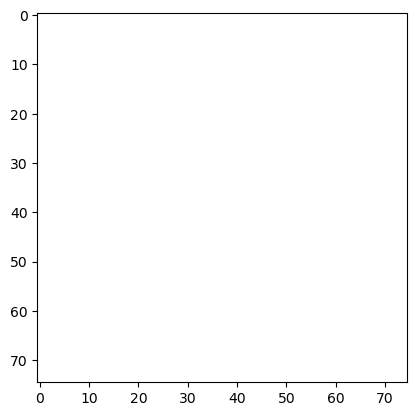

In [18]:
plt.imshow(im)

### Full Width at Half Maximum

#### Gaussian Kernel

Text(0, 0.5, 'Probability Density')

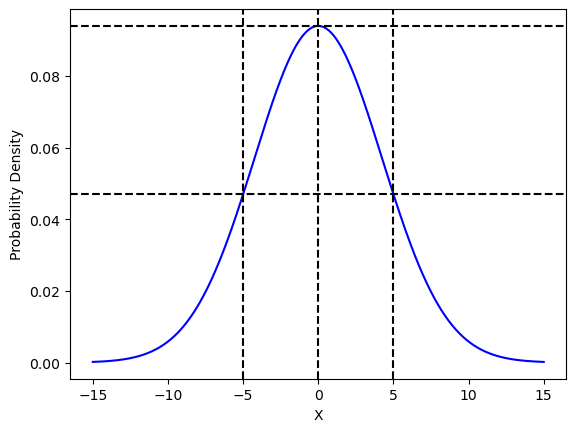

In [44]:
target_width = 10

sd = target_width / (2 * np.sqrt(2 * np.log(2)))

fig, ax = plt.subplots()
x = np.linspace(-15, 15, 1000)
ax.plot(x, norm.pdf(x, scale=sd), 'b-', label='Normal Distribution')
ax.axvline(0, linestyle="--", c="black")
ax.axvline(-sd * np.sqrt(2 * np.log(2)), linestyle="--", c="black")
ax.axvline(sd * np.sqrt(2 * np.log(2)), linestyle="--", c="black")
ax.axhline(norm.pdf(0, scale=sd), linestyle="--", c="black")
ax.axhline(norm.pdf(sd * np.sqrt(2 * np.log(2)), scale=sd), linestyle="--", c="black")

ax.set_xlabel('X')
ax.set_ylabel('Probability Density')

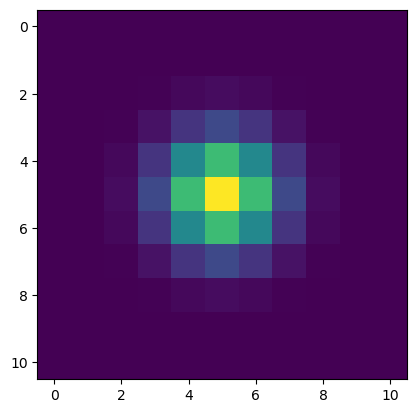

In [39]:
source_res = 3.7
target_res = 10
sd = target_res / (2 * np.sqrt(2 * np.log(2)))

kernel_radius = 5
kernel_width = kernel_radius * 2 + 1 # + 1 so has center
locs = (np.stack(np.meshgrid(np.arange(kernel_width), np.arange(kernel_width)), axis=2) - kernel_radius) * source_res

mvn = multivariate_normal([0, 0], [[sd**2, 0], [0, sd**2]])
kernel = mvn.pdf(locs.reshape(-1,2)).reshape(11,11)
kernel /= np.sum(kernel) # make it sum to 1
plt.imshow(kernel / np.sum(kernel))

#### Degradation

In [165]:
def get_sd_from_fwfm(pixel_width):
    return pixel_width / (2 * np.sqrt(2 * np.log(2)))

def get_adj_res(target_res, source_res):
    div = int(target_res // source_res)
    offset = np.argmin([abs(div * source_res - target_res), abs((div + 1) * source_res - target_res)]).astype(int)
    mul = div + offset
    adj_res = source_res * mul
    return adj_res, mul

def get_gaussian_kernel(radius, variance, res):
    width = radius * 2 + 1 # + 1 so has center
    locs = (np.stack(np.meshgrid(np.arange(width), np.arange(width)), axis=2) - radius) * res

    mvn = multivariate_normal([0, 0], [[variance, 0], [0, variance]])
    kernel = mvn.pdf(locs.reshape(-1,2)).reshape(width, width)
    kernel /= np.sum(kernel) # make it sum to 1

    return kernel

# wastes some flops, but it's simple and readable
def strided_convolution(im, kernel, stride):
    output = np.stack([convolve2d(im[:,:,i], kernel, mode='valid') for i in range(im.shape[-1])], axis=2)
    return output[::stride,::stride]

adjusted resolution = 14.8, target resolution = 15
(127, 241, 6)
(124, 221, 6)


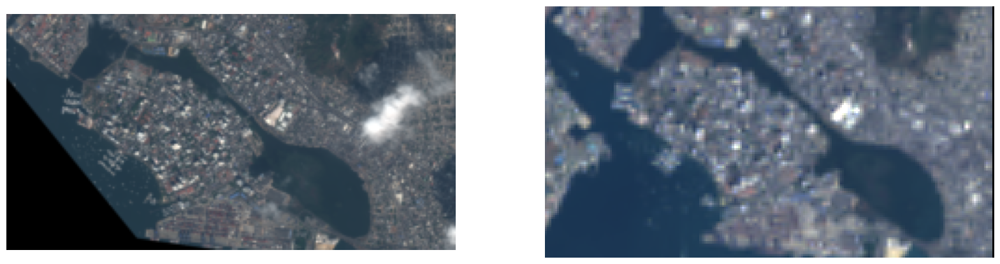

In [169]:
target_res = 15
source_res = 3.7
kernel_radius = 5

# degrade/coregister higher res bands to match 3.7m swir bands
swir_fn, _, ms_fn = wv.coreg_tifs(base_dir, gdal.GRA_Bilinear, ref_idx=0) # use swir as reference for coreg
swir_bands = wv.load_tif(swir_fn, is_swir=True)
ms_bands = wv.load_tif(ms_fn)

adj_res, mul = get_adj_res(target_res, source_res)
sd = get_sd_from_fwfm(adj_res)
kernel = get_gaussian_kernel(kernel_radius, sd**2, source_res)

bands = np.concatenate([ms_bands[:,:,[1, 2, 4, 6]], swir_bands[:,:,[1, 5]]], axis=2)
output = strided_convolution(bands, kernel, stride=mul)

print(f"adjusted resolution = {adj_res}, target resolution = {target_res}")

fig, ax = plt.subplots(1, 2, figsize=(20, 12))
axs = ax.ravel()

def plot_im_on_axis(ax, im):
    cloud_mask = np.zeros(im.shape[:-1], dtype=bool)
    im = im[:,:,[2,1,0]]
    ax.imshow(SDS_preprocess.rescale_image_intensity(im, cloud_mask, 99.9), interpolation=None)
    ax.axis(False)

# bands = [output, sim_bands, l8_bands, l9_bands]
bands = [output, l8_bands[15:,45:,:]]
for ax, band in zip(axs, bands):
    print(f"{band.shape}")
    plot_im_on_axis(ax, band)